Dataset Shape: (50, 56)

Data Types:
 Conversation_ID                  int64
Speech_Balance_Ratio           float64
Engagement_Diff                float64
Talkativeness_Human            float64
Participant_x                    int64
PercentLookingAtChris          float64
TotalFramesCompared              int64
TimeStart                      float64
TimeEnd                        float64
InteractionDurationSeconds     float64
Total_Turns                      int64
Human_Turns                      int64
AI_Turns                         int64
Turn_Balance                   float64
Sentiment_Alignment            float64
Overlap_Ratio From Voice       float64
Engagement_Score               float64
Group                           object
Hand DTW_Distance              float64
Participant                      int64
AverageHeadSync                float64
NumStreaks                       int64
TotalGazeTime                  float64
AverageGazeDuration            float64
LongestStreak             

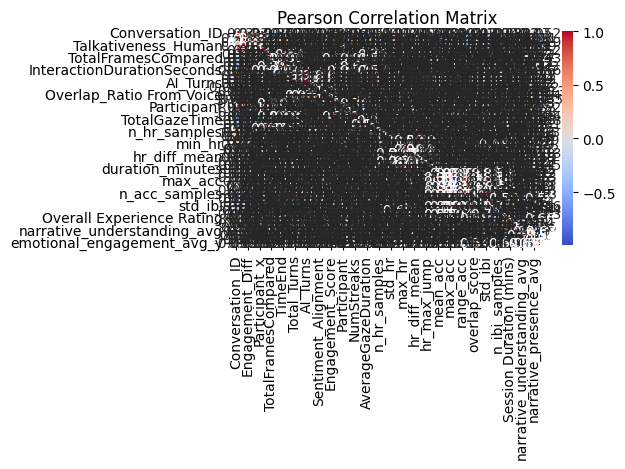


Statistical Significance (p-values) of Pearson Correlations:
Conversation_ID vs Speech_Balance_Ratio: r = 0.242, p = 0.09047 
Conversation_ID vs Engagement_Diff: r = 0.312, p = 0.02758 *
Conversation_ID vs Talkativeness_Human: r = 0.226, p = 0.11504 
Conversation_ID vs Participant_x: r = 1.000, p = 0.00000 *
Conversation_ID vs PercentLookingAtChris: r = -0.107, p = 0.45827 
Conversation_ID vs TotalFramesCompared: r = -0.196, p = 0.17248 
Conversation_ID vs TimeStart: r = -0.355, p = 0.01152 *
Conversation_ID vs TimeEnd: r = -0.310, p = 0.02837 *
Conversation_ID vs InteractionDurationSeconds: r = -0.077, p = 0.59320 
Conversation_ID vs Total_Turns: r = 0.238, p = 0.09660 
Conversation_ID vs Human_Turns: r = 0.238, p = 0.09657 
Conversation_ID vs AI_Turns: r = 0.238, p = 0.09662 
Conversation_ID vs Turn_Balance: r = -0.000, p = 0.99904 
Conversation_ID vs Sentiment_Alignment: r = -0.095, p = 0.51184 
Conversation_ID vs Overlap_Ratio From Voice: r = 0.066, p = 0.64883 
Conversation_ID vs

ValueError: `x` and `y` must have the same length along `axis`.

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr, chi2_contingency, ttest_ind, f_oneway

# 1. Load Excel file
file_path = r'C:\Users\bmoha\Desktop\DataCollection\SumTotal.xlsx'  # Change to your Excel file path
df = pd.read_excel(file_path)

# 2. Quick Data Overview
print("Dataset Shape:", df.shape)
print("\nData Types:\n", df.dtypes)
print("\nMissing Values:\n", df.isnull().sum())

# 3. Select numerical and categorical columns
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = df.select_dtypes(exclude=[np.number]).columns.tolist()

print("\nNumerical columns:", num_cols)
print("Categorical columns:", cat_cols)

# 4. Correlation Matrix (Numerical)
corr_matrix = df[num_cols].corr(method='pearson')
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Pearson Correlation Matrix")
plt.tight_layout()
plt.show()

# 5. Pairwise Pearson correlation significance test
print("\nStatistical Significance (p-values) of Pearson Correlations:")
for i in range(len(num_cols)):
    for j in range(i + 1, len(num_cols)):
        col1, col2 = num_cols[i], num_cols[j]
        r, p = pearsonr(df[col1].dropna(), df[col2].dropna())
        print(f"{col1} vs {col2}: r = {r:.3f}, p = {p:.5f} {'*' if p < 0.05 else ''}")

# 6. Categorical vs Numerical Analysis
print("\nCategorical vs Numerical: ANOVA or t-test")

for cat in cat_cols:
    if df[cat].nunique() <= 10:  # Keep only categorical with a manageable number of categories
        print(f"\nAnalyzing {cat}:")
        for num in num_cols:
            groups = [df[num][df[cat] == level].dropna() for level in df[cat].unique()]
            if len(groups) == 2:
                stat, p = ttest_ind(*groups)
                test_name = "T-test"
            else:
                stat, p = f_oneway(*groups)
                test_name = "ANOVA"
            print(f"{test_name} for {num} across {cat}: p = {p:.5f} {'*' if p < 0.05 else ''}")

# 7. Categorical vs Categorical: Chi-square test
print("\nCategorical vs Categorical: Chi-square test")
for i in range(len(cat_cols)):
    for j in range(i + 1, len(cat_cols)):
        c1, c2 = cat_cols[i], cat_cols[j]
        contingency_table = pd.crosstab(df[c1], df[c2])
        if contingency_table.shape[0] > 1 and contingency_table.shape[1] > 1:
            chi2, p, dof, ex = chi2_contingency(contingency_table)
            print(f"Chi-square between {c1} and {c2}: p = {p:.5f} {'*' if p < 0.05 else ''}")


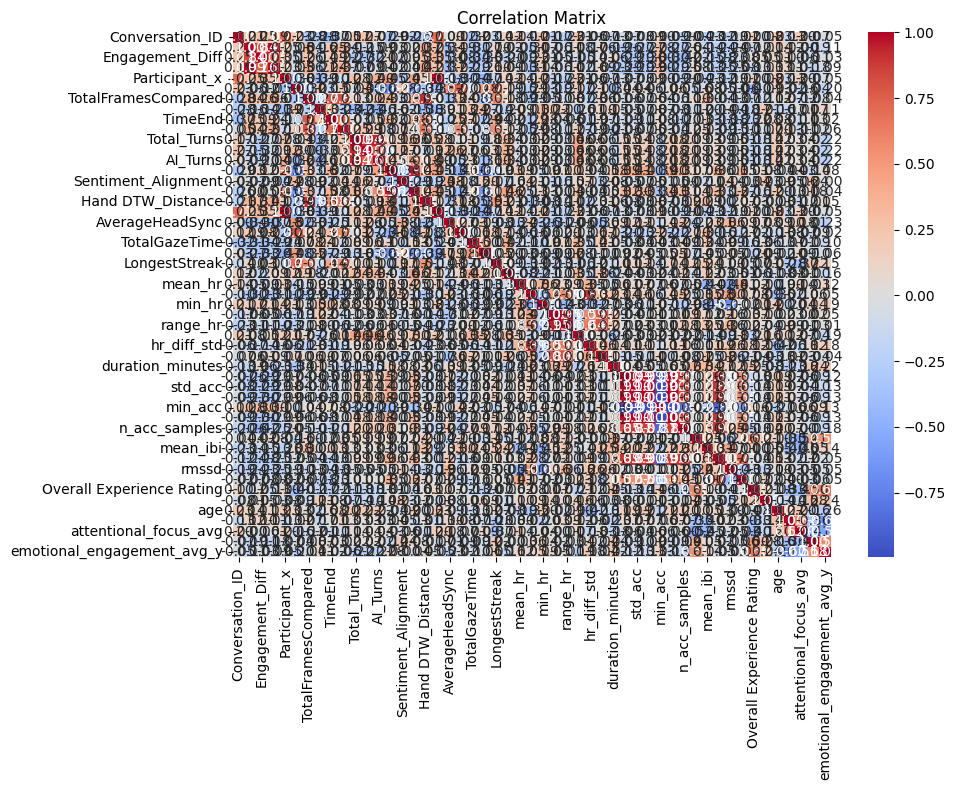

In [3]:


# Identify numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Correlation matrix
corr = df[numerical_cols].corr()

# Visualize with heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix")
plt.tight_layout()
plt.show()


In [6]:
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm



# Drop non-numeric columns and rows with missing values
df = df.select_dtypes(include=["float64", "int64"])
df = df.dropna()

# Define target
target = "Engagement_Score"
if target not in df.columns:
    raise ValueError(f"Target column '{target}' not found in dataset.")

X = df.drop(columns=[target])
y = df[target]

# Step 1: Correlation
correlation_with_target = df.corr()[target].sort_values(ascending=False)

# Step 2: RFE
model = LinearRegression()
rfe = RFE(model, n_features_to_select=5)
rfe.fit(X, y)
rfe_selected = X.columns[rfe.support_]

# Step 3: OLS Regression for significance
X_ols = sm.add_constant(X)
ols_model = sm.OLS(y, X_ols).fit()
ols_summary = ols_model.summary2().tables[1]
significant_features = ols_summary[ols_summary['P>|t|'] < 0.05].index.tolist()
if "const" in significant_features:
    significant_features.remove("const")

# Summary
print("\n✅ Top Features Based on:")
print("- Correlation with Engagement_Score:\n", correlation_with_target.head(10))
print("- RFE Selection:\n", list(rfe_selected))
print("- Statistically Significant Features (p < 0.05):\n", significant_features)


ValueError: Target column 'Engagement_Score' not found in dataset.

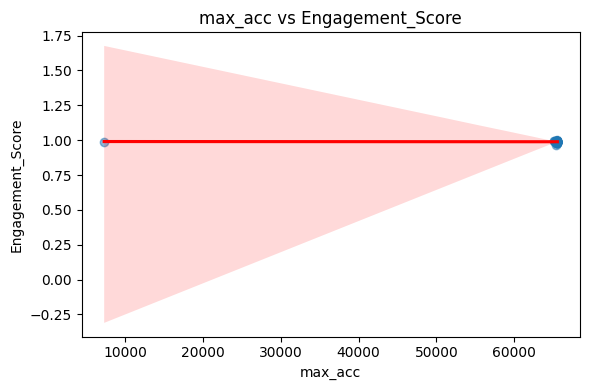

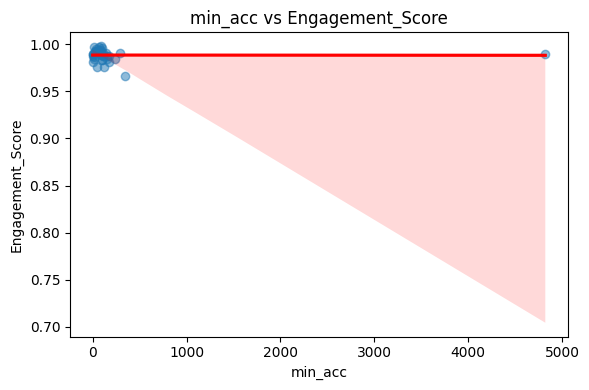

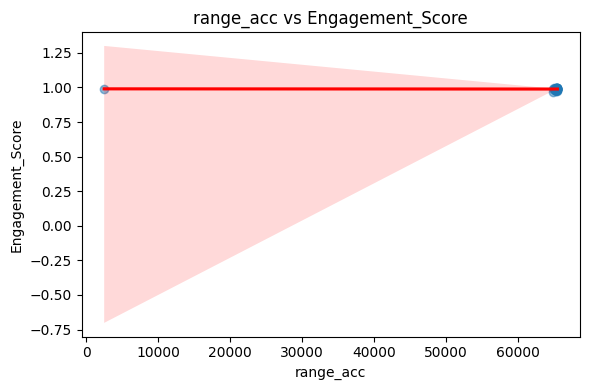

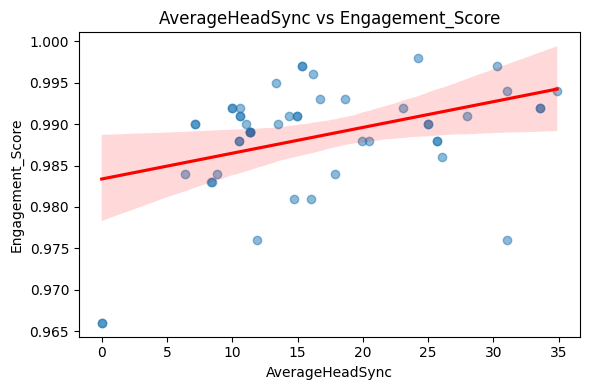

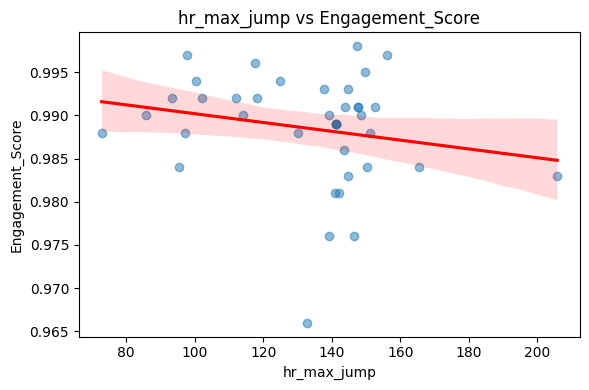

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm

# === Load the Excel file ===
file_path = r"C:\Users\bmoha\Desktop\DataCollection\SumTotal.xlsx"  # Update this if your file is in another path
df = pd.read_excel(file_path)

# === Define target variable ===
target = "Engagement_Score"

# === Drop non-numeric columns and rows with missing values ===
numeric_df = df.select_dtypes(include=['number']).dropna()

# === Define X and y ===
X = numeric_df.drop(columns=[target])
y = numeric_df[target]

# === Add constant term for regression ===
X_with_const = sm.add_constant(X)

# === Fit OLS model ===
model = sm.OLS(y, X_with_const).fit()

# === Get p-values and extract top 5 significant features (excluding intercept) ===
p_values = model.pvalues.drop("const")
significant_features = p_values[p_values < 0.05].sort_values()
top_features = significant_features.head(5).index.tolist()

# === Plotting ===
for feature in top_features:
    plt.figure(figsize=(6, 4))
    sns.regplot(x=df[feature], y=df[target], scatter_kws={'alpha': 0.5}, line_kws={'color': 'red'})
    plt.title(f"{feature} vs {target}")
    plt.xlabel(feature)
    plt.ylabel(target)
    plt.tight_layout()
    plt.show()


In [10]:
 # adjust path if needed
print("🔍 Available columns:")
print(df.columns.tolist())


🔍 Available columns:
['Conversation_ID', 'Speech_Balance_Ratio', 'Engagement_Diff', 'Talkativeness_Human', 'Participant_x', 'PercentLookingAtChris', 'TotalFramesCompared', 'TimeStart', 'TimeEnd', 'InteractionDurationSeconds', 'Total_Turns', 'Human_Turns', 'AI_Turns', 'Turn_Balance', 'Sentiment_Alignment', 'Overlap_Ratio From Voice', 'Engagement_Score', 'Group', 'Hand DTW_Distance', 'Participant', 'AverageHeadSync', 'NumStreaks', 'TotalGazeTime', 'AverageGazeDuration', 'LongestStreak', 'city', 'n_hr_samples', 'mean_hr', 'std_hr', 'min_hr', 'max_hr', 'range_hr', 'hr_diff_mean', 'hr_diff_std', 'hr_max_jump', 'duration_minutes', 'mean_acc', 'std_acc', 'max_acc', 'min_acc', 'range_acc', 'n_acc_samples', 'gender_x', 'overlap_score', 'mean_ibi', 'std_ibi', 'rmssd', 'n_ibi_samples', 'gender_y', 'Overall Experience Rating', 'Session Duration (mins)', 'age', 'narrative_understanding_avg', 'attentional_focus_avg', 'narrative_presence_avg', 'emotional_engagement_avg_y']


In [12]:
import pandas as pd
from scipy.stats import pearsonr

# === Load your dataset ===


# === Drop non-numeric and identifier columns ===
df = df.drop(columns=["conversation_id"], errors='ignore')
df = df.select_dtypes(include=["number"])

# === Ensure 'Engagement_Score' is present ===
if "Engagement_Score" not in df.columns:
    raise ValueError("Column 'Engagement_Score' not found in the dataset.")

# === Store results ===
significant_results = []

# === Loop through columns to calculate Pearson correlation ===
for col in df.columns:
    if col == "Engagement_Score":
        continue
    r_val, p_val = pearsonr(df[col], df["Engagement_Score"])
    if p_val < 0.05:
        significant_results.append((col, r_val, p_val))

# === Print significant results ===
print("📊 Statistically Significant Correlations with Engagement_Score (p < 0.05):\n")
for col, r, p in sorted(significant_results, key=lambda x: abs(x[1]), reverse=True):
    print(f"{col:<40} r = {r:.3f}, p = {p:.5f}")


📊 Statistically Significant Correlations with Engagement_Score (p < 0.05):

Sentiment_Alignment                      r = 0.998, p = 0.00000
AverageHeadSync                          r = 0.403, p = 0.00375


In [16]:
import pandas as pd
from scipy.stats import pearsonr

# === Load dataset ===


# === Define the target and selected columns for correlation ===
target_col = "Engagement_Score"

# 🟡 Customize this list with columns you want to test
selected_columns = [
    'Speech_Balance_Ratio',
    'Engagement_Diff',
    'Talkativeness_Human',
    'PercentLookingAtChris',  
    'InteractionDurationSeconds',
    'Turn_Balance',
    'Sentiment_Alignment',
    'Overlap_Ratio From Voice', 
    'Hand DTW_Distance', 
    'AverageHeadSync', 
    'AverageGazeDuration',  
    'mean_acc', 
    'overlap_score',
    'mean_ibi', 
    'rmssd', 
    'Overall Experience Rating', 
    'Session Duration (mins)',
    'age', 
    'narrative_understanding_avg',
    'attentional_focus_avg',
    'narrative_presence_avg', 
    'emotional_engagement_avg_y'
]

# === Ensure only numeric data is used and drop missing ===
df = df[[target_col] + selected_columns].dropna()

# === Calculate and show significant correlations ===
print("📊 Significant correlations with Engagement Score:\n")
for col in selected_columns:
    if col not in df.columns:
        print(f"⚠️ Column '{col}' not found in the data.")
        continue

    r, p = pearsonr(df[col], df[target_col])
    if p < 0.05:
        print(f"{col:<30} r = {r:.5f}, p = {p:.5f}")


📊 Significant correlations with Engagement Score:

Sentiment_Alignment            r = 0.99787, p = 0.00000
AverageHeadSync                r = 0.52345, p = 0.00125


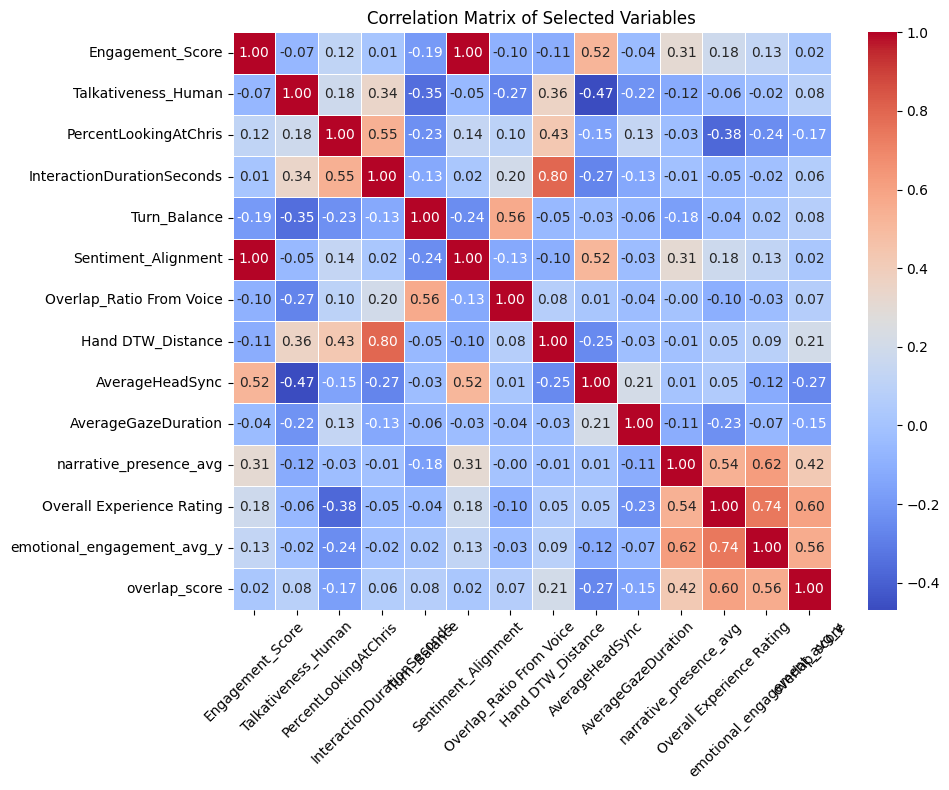

In [30]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === Load your data ===

# === List the columns you want to include in correlation ===
selected_columns = [
    'Engagement_Score',
    'Talkativeness_Human',
    'PercentLookingAtChris',  
    'InteractionDurationSeconds',
    'Turn_Balance',
    'Sentiment_Alignment',
    'Overlap_Ratio From Voice', 
    'Hand DTW_Distance', 
    'AverageHeadSync', 
    'AverageGazeDuration',  
    'narrative_presence_avg',
    'Overall Experience Rating',
    'emotional_engagement_avg_y',
    'overlap_score'
    
]

# === Filter and clean ===
df_selected = df[selected_columns].dropna()

# === Compute correlation matrix ===
correlation_matrix = df_selected.corr(method='pearson')

# === Plot heatmap ===
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix of Selected Variables")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


✅ Top 10 Selected Features by RFE:
- Speech_Balance_Ratio
- Talkativeness_Human
- PercentLookingAtChris
- Turn_Balance
- Sentiment_Alignment
- Hand DTW_Distance
- rmssd
- Overall Experience Rating
- age
- attentional_focus_avg


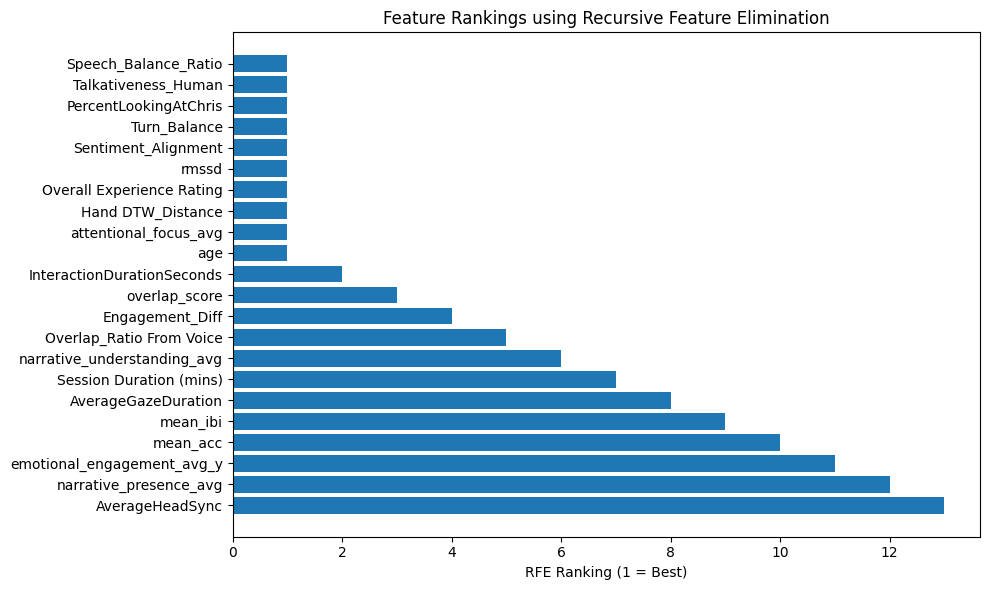

In [31]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# === Load dataset ===


# === Drop non-numeric and ID columns ===
df = df.drop(columns=["conversation_id"], errors='ignore')  # drop if exists

# === Drop rows with missing Engagement_Score ===
df = df[df["Engagement_Score"].notna()]

# === Select numeric columns ===
df_numeric = df.select_dtypes(include='number').dropna()

# === Define X and y ===
X = df_numeric.drop(columns=["Engagement_Score"])
y = df_numeric["Engagement_Score"]

# === Normalize the data ===
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# === Linear Regression model ===
model = LinearRegression()

# === RFE setup ===
rfe = RFE(estimator=model, n_features_to_select=10)
rfe.fit(X_scaled, y)

# === Get selected features ===
selected_features = X.columns[rfe.support_]

# === Print top features ===
print("✅ Top 10 Selected Features by RFE:")
for feature in selected_features:
    print("-", feature)

# === Optional: Plot feature rankings ===
ranking_df = pd.DataFrame({
    "Feature": X.columns,
    "Ranking": rfe.ranking_
}).sort_values(by="Ranking")

plt.figure(figsize=(10, 6))
plt.barh(ranking_df["Feature"], ranking_df["Ranking"])
plt.xlabel("RFE Ranking (1 = Best)")
plt.title("Feature Rankings using Recursive Feature Elimination")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


✅ Selected Features:
Index(['Speech_Balance_Ratio', 'Talkativeness_Human', 'PercentLookingAtChris',
       'Turn_Balance', 'Sentiment_Alignment', 'Hand DTW_Distance', 'rmssd',
       'Overall Experience Rating', 'age', 'attentional_focus_avg'],
      dtype='object')

📊 Final Regression Model Performance:
R² Score: 0.9852
MAE: 0.0002
RMSE: 0.0003


C:\Users\bmoha\AppData\Local\Temp\ipykernel_19276\4114026663.py:64: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


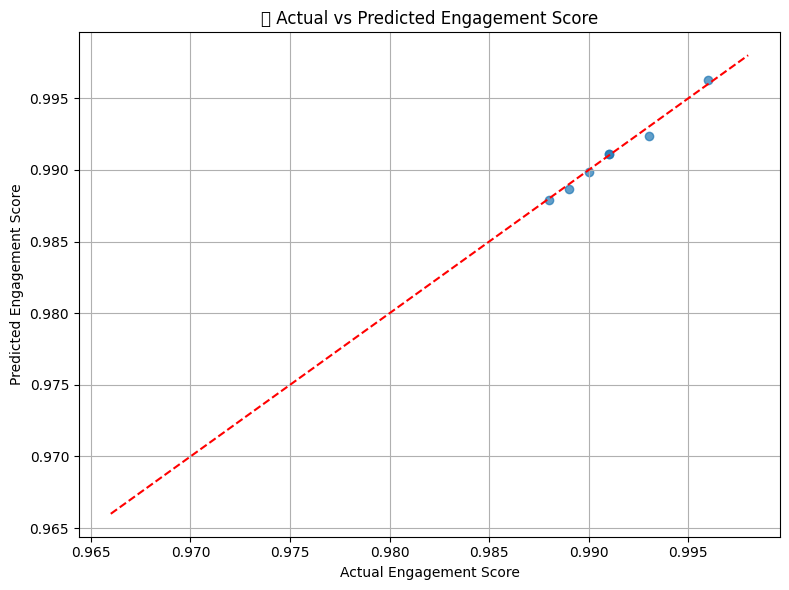

In [32]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np



# === Clean and Prepare Data ===
df = df.drop(columns=["conversation_id"], errors='ignore')  # Drop ID column if exists
df = df[df["Engagement_Score"].notna()]  # Remove rows with missing target
df_numeric = df.select_dtypes(include='number').dropna()  # Use only complete numeric data

# === Split Features and Target ===
X = df_numeric.drop(columns=["Engagement_Score"])
y = df_numeric["Engagement_Score"]

# === Scale Features ===
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# === Feature Selection: RFE ===
model = LinearRegression()
rfe = RFE(estimator=model, n_features_to_select=10)
rfe.fit(X_scaled, y)
selected_features = X.columns[rfe.support_]
print("✅ Selected Features:")
print(selected_features)

# === Build Final Model using Selected Features ===
X_selected = X[selected_features]
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# Scale only selected features
scaler_selected = StandardScaler()
X_train_scaled = scaler_selected.fit_transform(X_train)
X_test_scaled = scaler_selected.transform(X_test)

final_model = LinearRegression()
final_model.fit(X_train_scaled, y_train)
y_pred = final_model.predict(X_test_scaled)

# === Evaluate Performance ===
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"\n📊 Final Regression Model Performance:")
print(f"R² Score: {r2:.4f}")
print(f"MAE: {mae:.4f}")
print(f"RMSE: {rmse:.4f}")

# === Plot: Predicted vs Actual Engagement Score ===
plt.figure(figsize=(8,6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
plt.xlabel("Actual Engagement Score")
plt.ylabel("Predicted Engagement Score")
plt.title("📈 Actual vs Predicted Engagement Score")
plt.grid(True)
plt.tight_layout()
plt.show()


In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Load your Excel or CSV file
df = pd.read_excel(r"C:\Users\bmoha\Desktop\DataCollection\SumTotal.xlsx")  # or pd.read_csv("your_file.csv")

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, mannwhitneyu



# Ensure 'city' column exists
if 'city' not in df.columns:
    raise KeyError("❌ 'city' column not found in the dataset.")

# Convert city to string for consistent grouping
df['city'] = df['city'].astype(str)

# === List of metrics to compare ===
metrics = ['Hand DTW_Distance', 'rmssd', 'Speech_Balance_Ratio', 'Engagement_Score']  # Add more if needed

# === Perform boxplots + p-value annotations ===
for metric in metrics:
    if metric in df.columns:
        plt.figure(figsize=(8, 6))

        # Get the two groups
        city_names = df['city'].unique()
        if len(city_names) != 2:
            print(f"⚠️ Cannot perform test: Expected exactly 2 cities, found {len(city_names)}")
            continue
        
        group1 = df[df['city'] == city_names[0]][metric].dropna()
        group2 = df[df['city'] == city_names[1]][metric].dropna()

        # === Perform Welch’s t-test ===
        stat, p_value = ttest_ind(group1, group2, equal_var=False)

        # === Boxplot ===
        sns.boxplot(data=df, x='city', y=metric, palette='Set2')
        plt.title(f'{metric} by City\np-value = {p_value:.4f}')
        plt.xlabel('City')
        plt.ylabel(metric.replace('_', ' '))
        
        # Annotate p-value on plot
        max_val = max(df[metric])
        plt.text(0.5, max_val, f"p = {p_value:.4f}", ha='center', va='bottom', fontsize=10)

        plt.tight_layout()
        plt.savefig(f'boxplot_{metric}_by_city_with_pvalue.png', dpi=300)
        plt.show()

    else:
        print(f"⚠️ Column '{metric}' not found in dataset.")



⚠️ Cannot perform test: Expected exactly 2 cities, found 3
⚠️ Cannot perform test: Expected exactly 2 cities, found 3
⚠️ Cannot perform test: Expected exactly 2 cities, found 3
⚠️ Cannot perform test: Expected exactly 2 cities, found 3


<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

In [35]:
print(df.columns.tolist())

['Engagement_Score', 'Speech_Balance_Ratio', 'Engagement_Diff', 'Talkativeness_Human', 'PercentLookingAtChris', 'InteractionDurationSeconds', 'Turn_Balance', 'Sentiment_Alignment', 'Overlap_Ratio From Voice', 'Hand DTW_Distance', 'AverageHeadSync', 'AverageGazeDuration', 'mean_acc', 'overlap_score', 'mean_ibi', 'rmssd', 'Overall Experience Rating', 'Session Duration (mins)', 'age', 'narrative_understanding_avg', 'attentional_focus_avg', 'narrative_presence_avg', 'emotional_engagement_avg_y']


In [38]:
# Strip whitespace and drop NaNs
df['city'] = df['city'].astype(str).str.strip()

# Print unique values to debug
print("Unique cities found:", df['city'].unique())


Unique cities found: ['Lisbon' 'Dublin' 'nan']


✅ Cleaned cities: ['Lisbon' 'Dublin']


C:\Users\bmoha\AppData\Local\Temp\ipykernel_19276\2389831792.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='city', y=metric, palette='Set2')


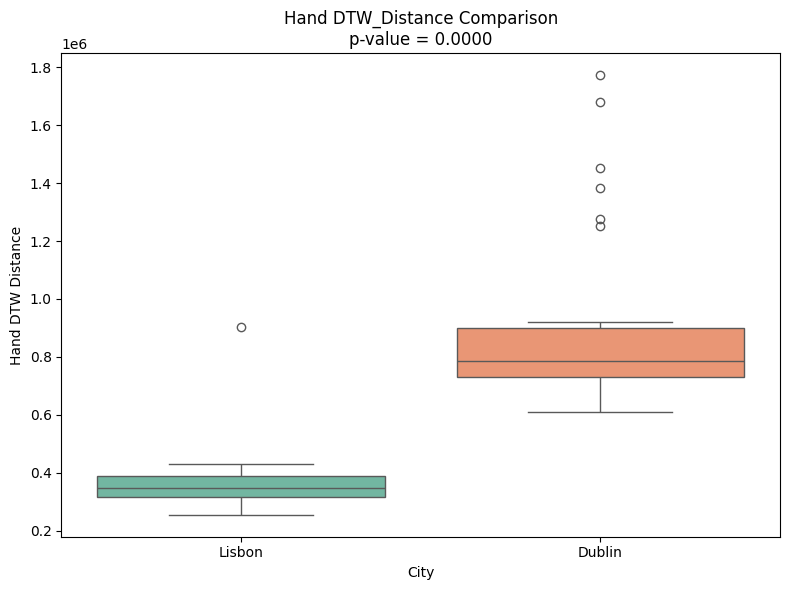

📊 Hand DTW_Distance: Mann-Whitney U test p-value = 0.0000


C:\Users\bmoha\AppData\Local\Temp\ipykernel_19276\2389831792.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='city', y=metric, palette='Set2')


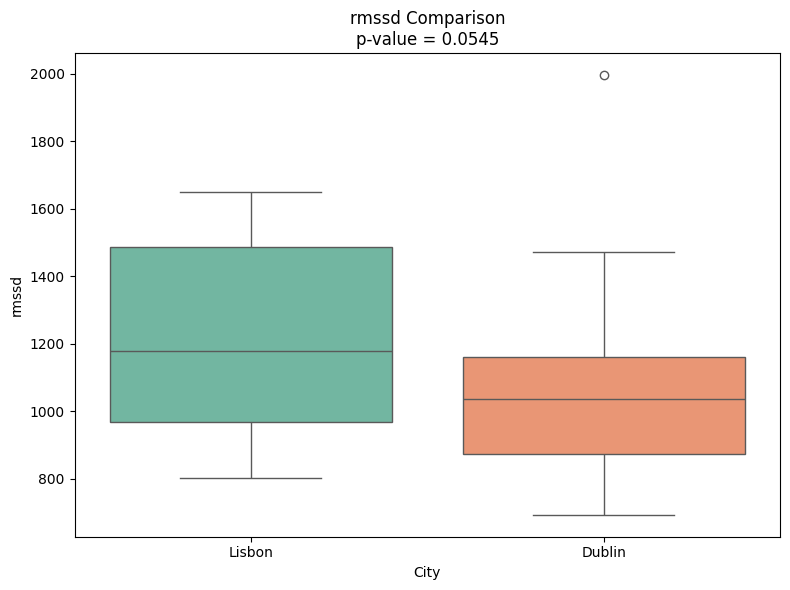

📊 rmssd: Mann-Whitney U test p-value = 0.0545


C:\Users\bmoha\AppData\Local\Temp\ipykernel_19276\2389831792.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='city', y=metric, palette='Set2')


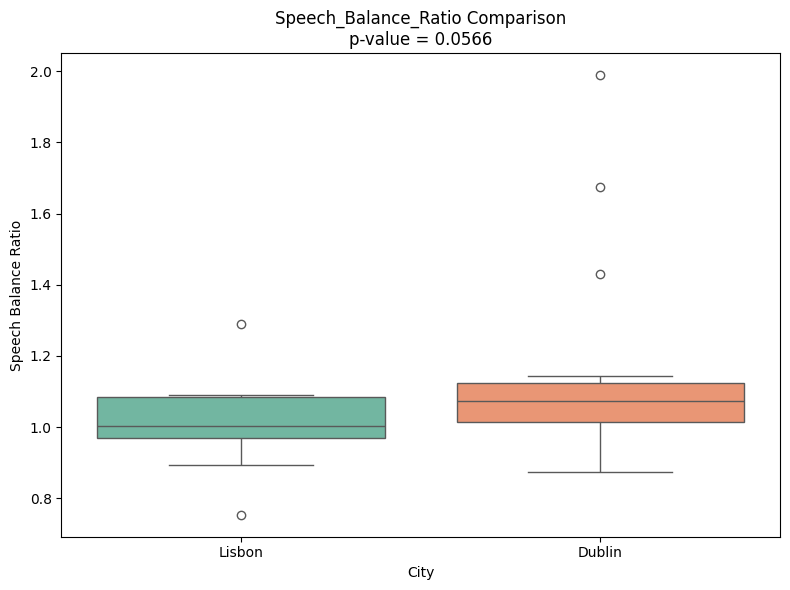

📊 Speech_Balance_Ratio: Mann-Whitney U test p-value = 0.0566


C:\Users\bmoha\AppData\Local\Temp\ipykernel_19276\2389831792.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='city', y=metric, palette='Set2')


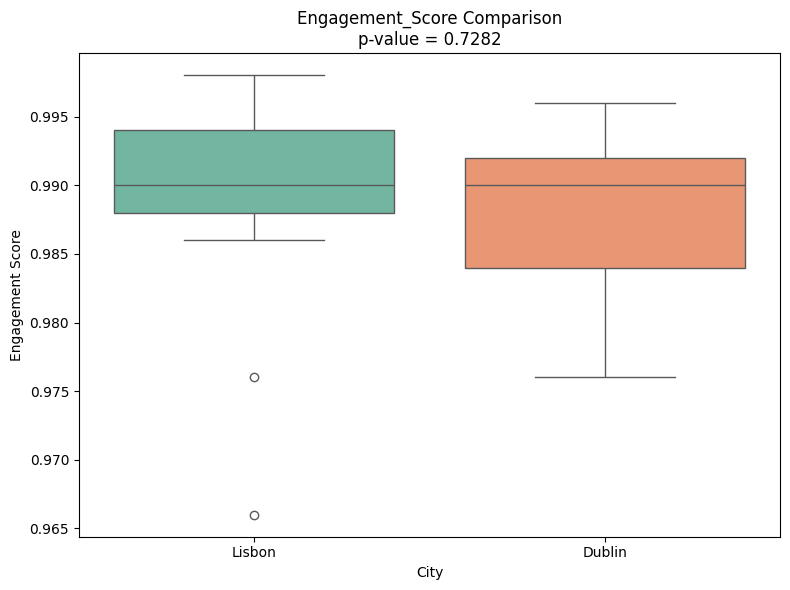

📊 Engagement_Score: Mann-Whitney U test p-value = 0.7282


C:\Users\bmoha\AppData\Local\Temp\ipykernel_19276\2389831792.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='city', y=metric, palette='Set2')


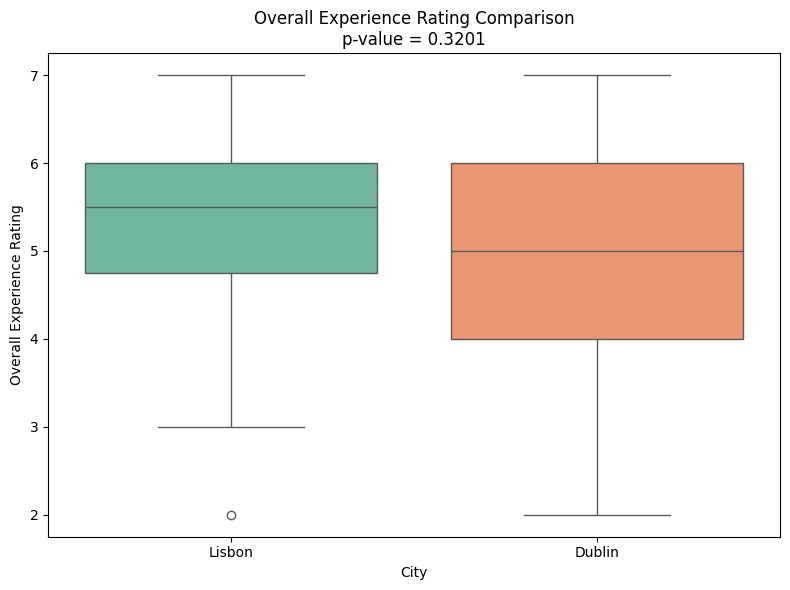

📊 Overall Experience Rating: Mann-Whitney U test p-value = 0.3201


C:\Users\bmoha\AppData\Local\Temp\ipykernel_19276\2389831792.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='city', y=metric, palette='Set2')


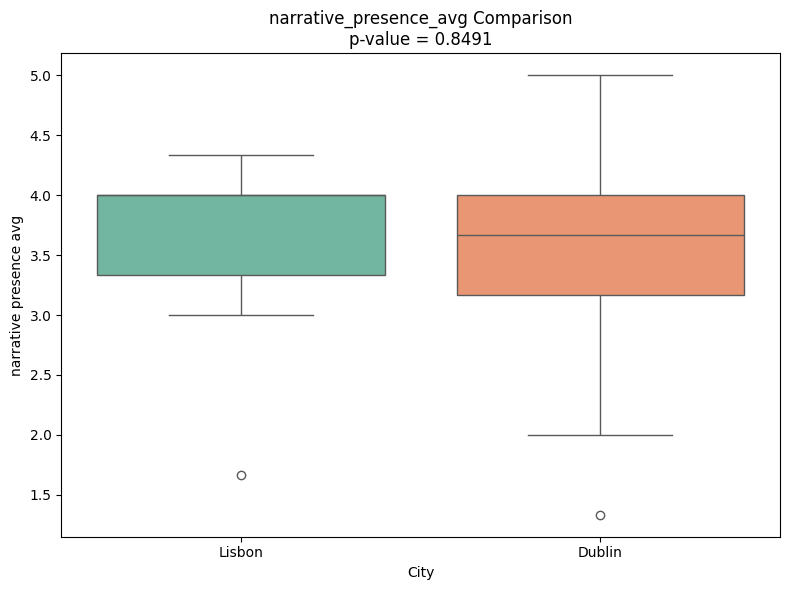

📊 narrative_presence_avg: Mann-Whitney U test p-value = 0.8491


C:\Users\bmoha\AppData\Local\Temp\ipykernel_19276\2389831792.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='city', y=metric, palette='Set2')


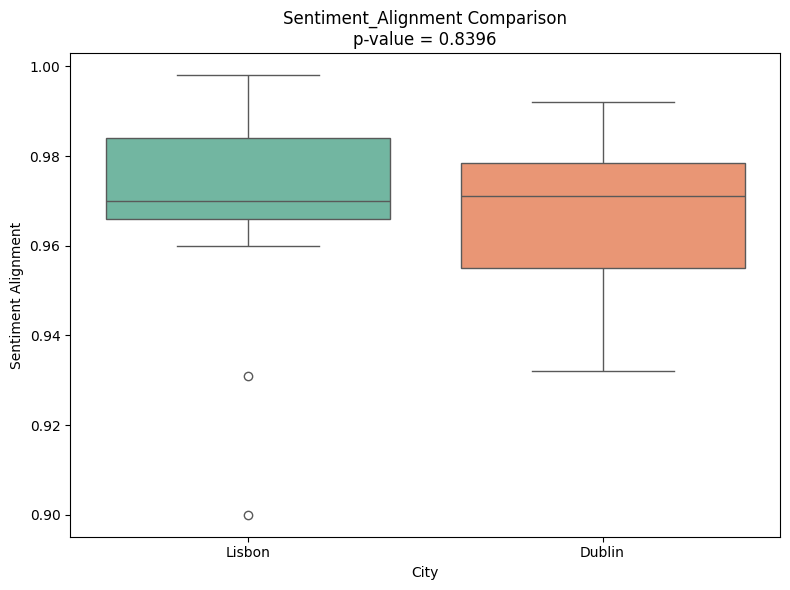

📊 Sentiment_Alignment: Mann-Whitney U test p-value = 0.8396


C:\Users\bmoha\AppData\Local\Temp\ipykernel_19276\2389831792.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='city', y=metric, palette='Set2')


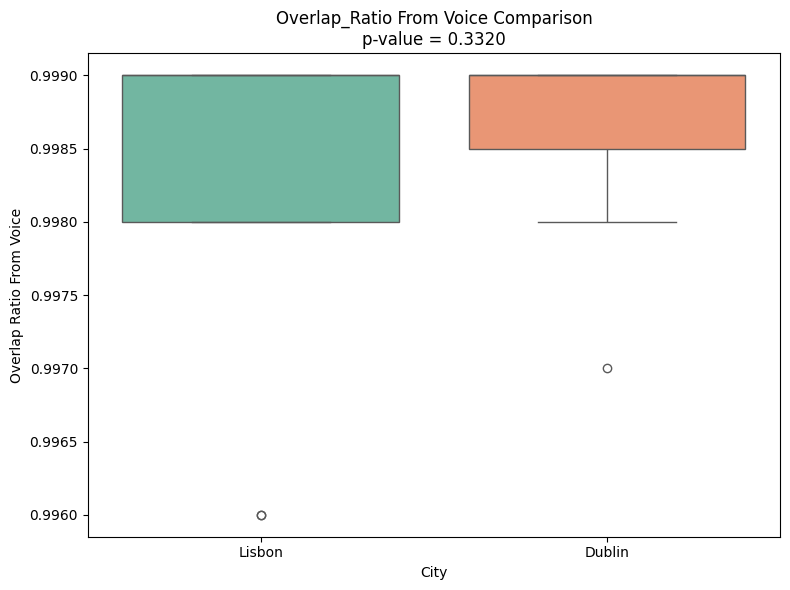

📊 Overlap_Ratio From Voice: Mann-Whitney U test p-value = 0.3320


C:\Users\bmoha\AppData\Local\Temp\ipykernel_19276\2389831792.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='city', y=metric, palette='Set2')


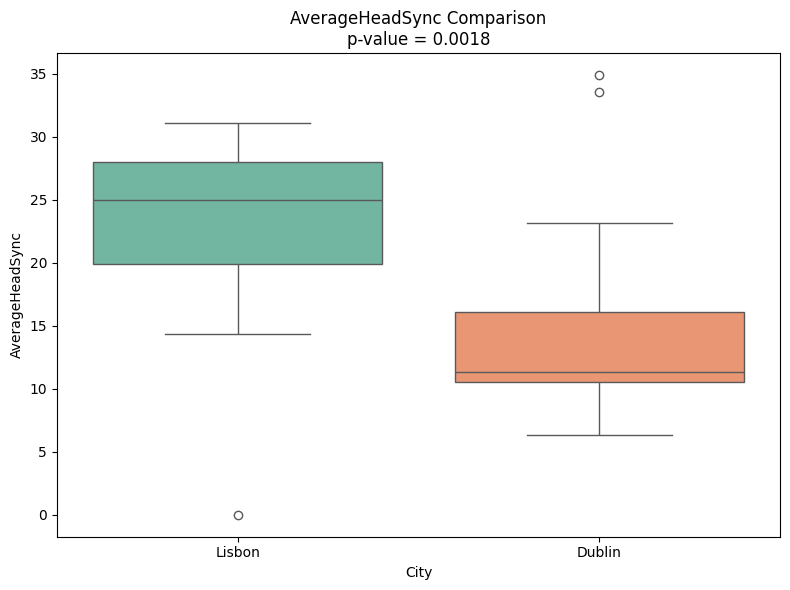

📊 AverageHeadSync: Mann-Whitney U test p-value = 0.0018


In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, mannwhitneyu

# === Load the dataset ===


# === Clean the 'city' column ===
df['city'] = df['city'].astype(str).str.strip()

# Filter only Lisbon and Dublin, ignore rows like 'nan'
valid_cities = ['Lisbon', 'Dublin']
df = df[df['city'].isin(valid_cities)]

# Print cleaned city labels
print("✅ Cleaned cities:", df['city'].unique())

# === List of metrics to compare ===
metrics = ['Hand DTW_Distance', 'rmssd', 'Speech_Balance_Ratio', 'Engagement_Score', 'Overall Experience Rating','narrative_presence_avg','Sentiment_Alignment','Overlap_Ratio From Voice','AverageHeadSync'   ]  # Add more if needed

# === Generate boxplots with statistical tests ===
for metric in metrics:
    if metric in df.columns:
        data1 = df[df['city'] == 'Lisbon'][metric].dropna()
        data2 = df[df['city'] == 'Dublin'][metric].dropna()

        # Choose test based on distribution – using Mann-Whitney U for non-parametric assumption
        stat, p_value = mannwhitneyu(data1, data2, alternative='two-sided')

        plt.figure(figsize=(8, 6))
        sns.boxplot(data=df, x='city', y=metric, palette='Set2')
        plt.title(f'{metric} Comparison\np-value = {p_value:.4f}')
        plt.xlabel('City')
        plt.ylabel(metric.replace('_', ' '))
        plt.tight_layout()
        plt.savefig(f'boxplot_{metric}_by_city.png', dpi=300)
        plt.show()

        print(f"📊 {metric}: Mann-Whitney U test p-value = {p_value:.4f}")
    else:
        print(f"⚠️ Column '{metric}' not found in dataset.")


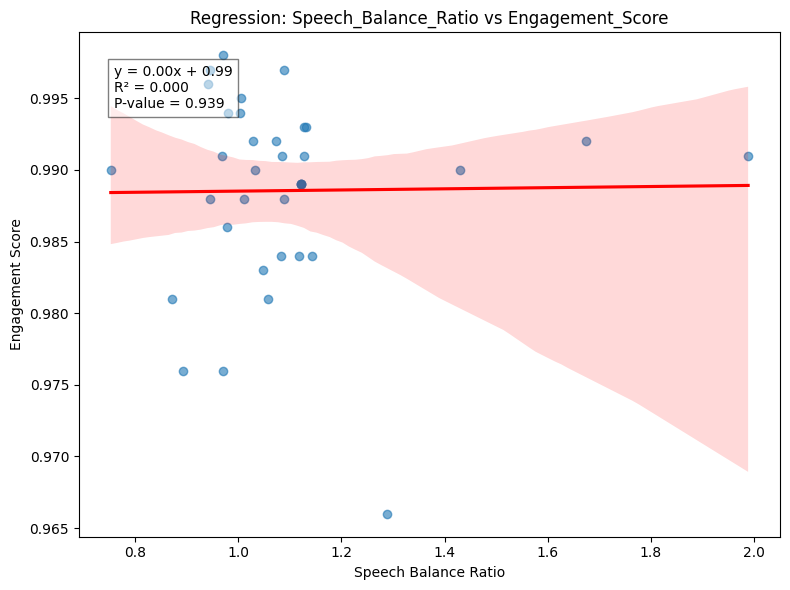

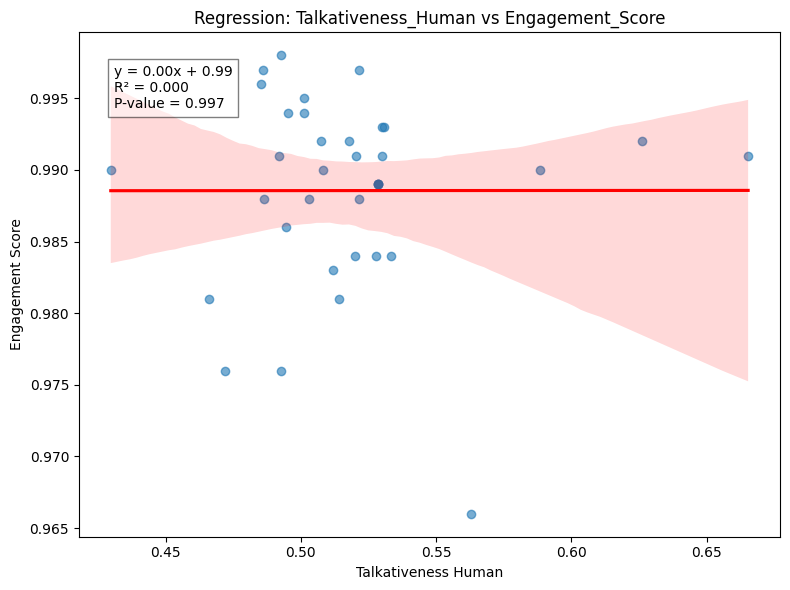

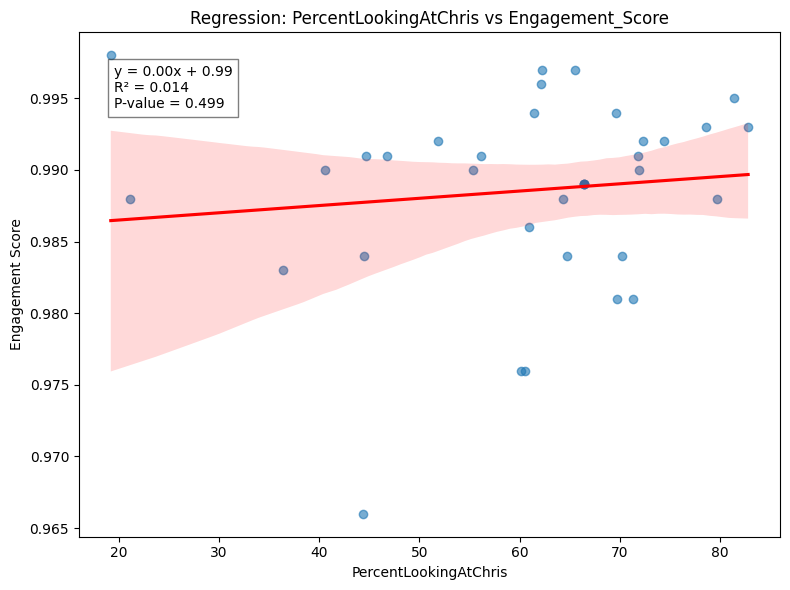

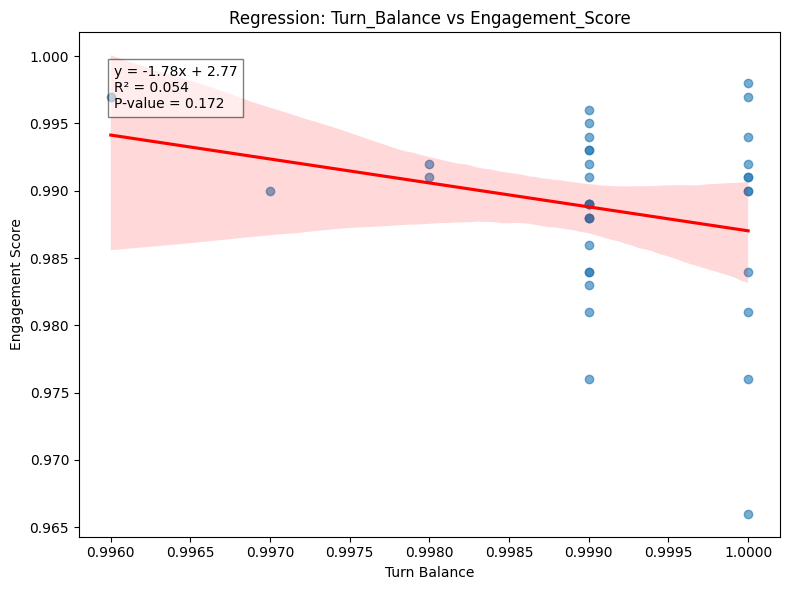

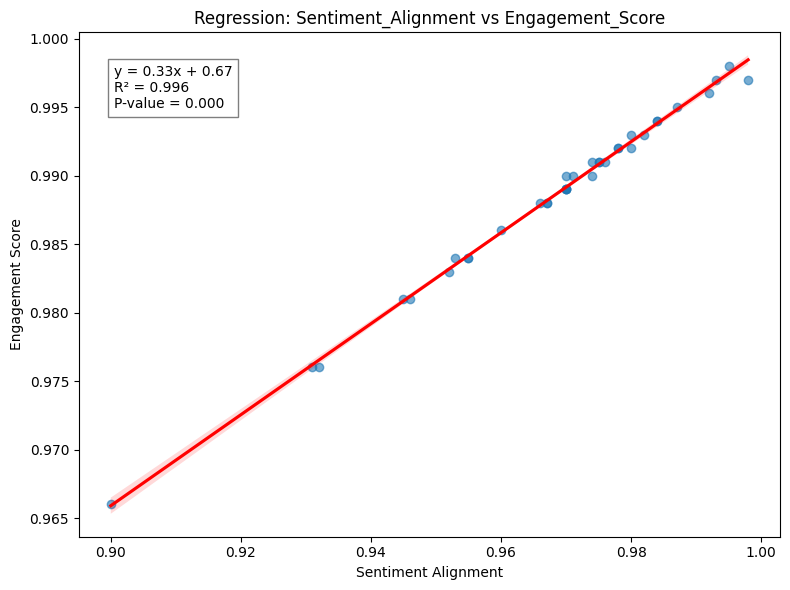

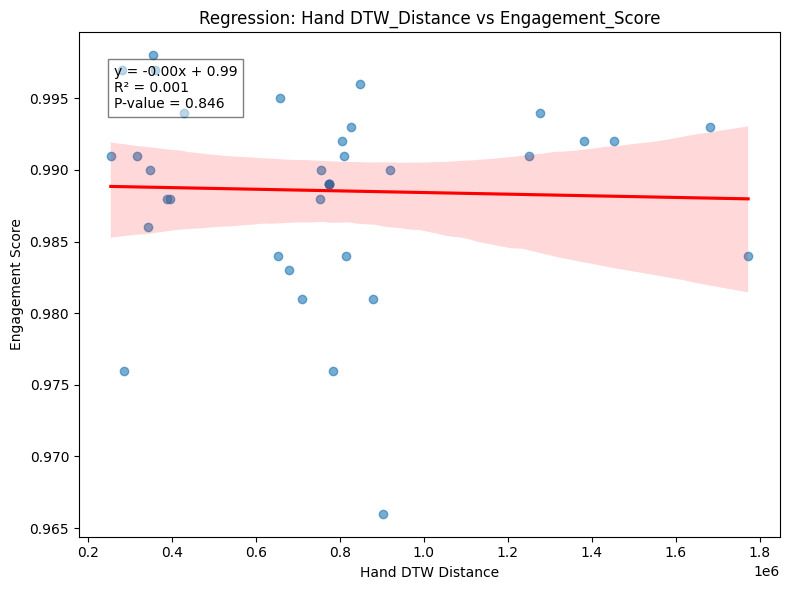

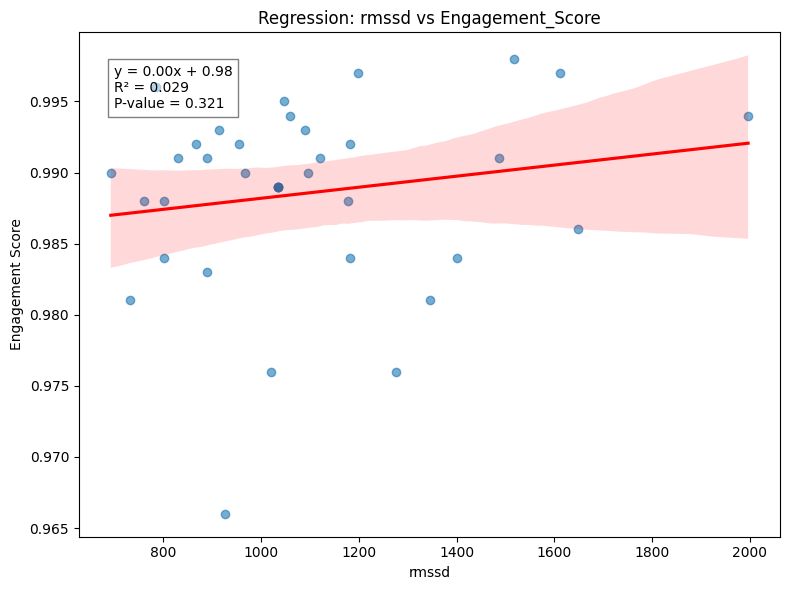

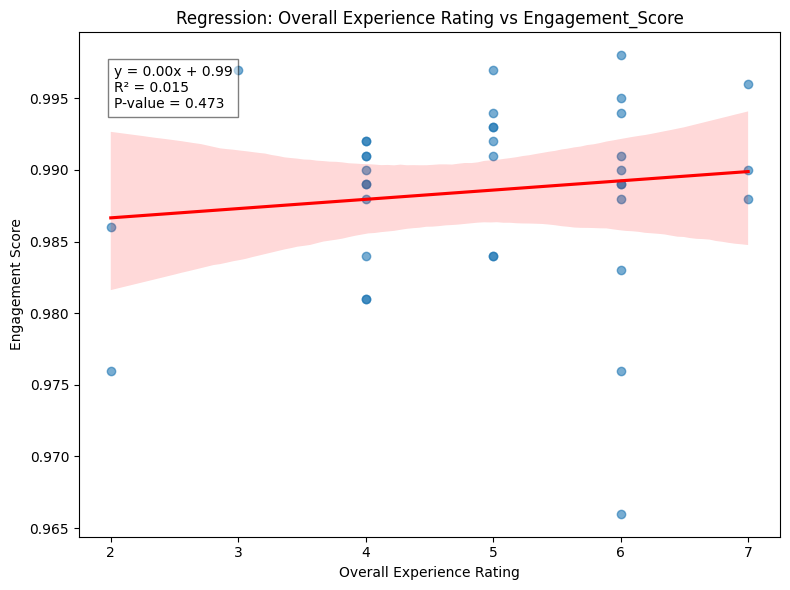

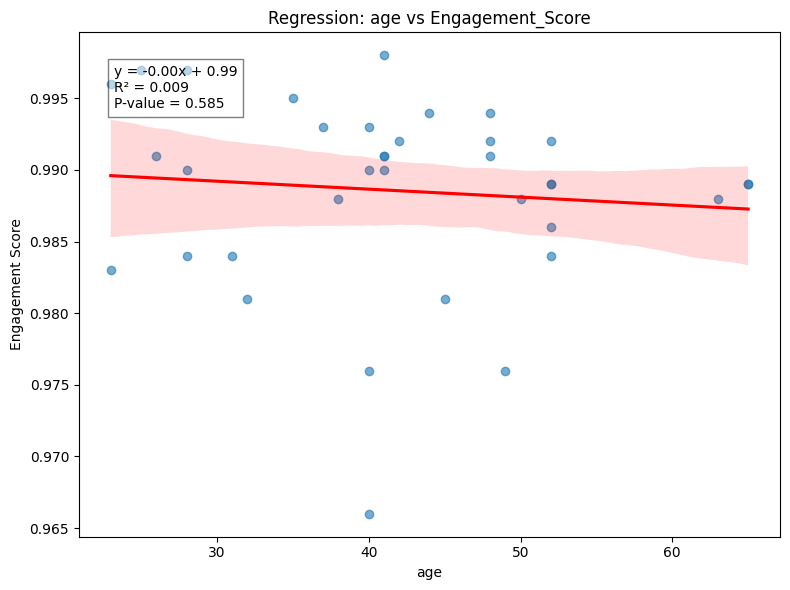

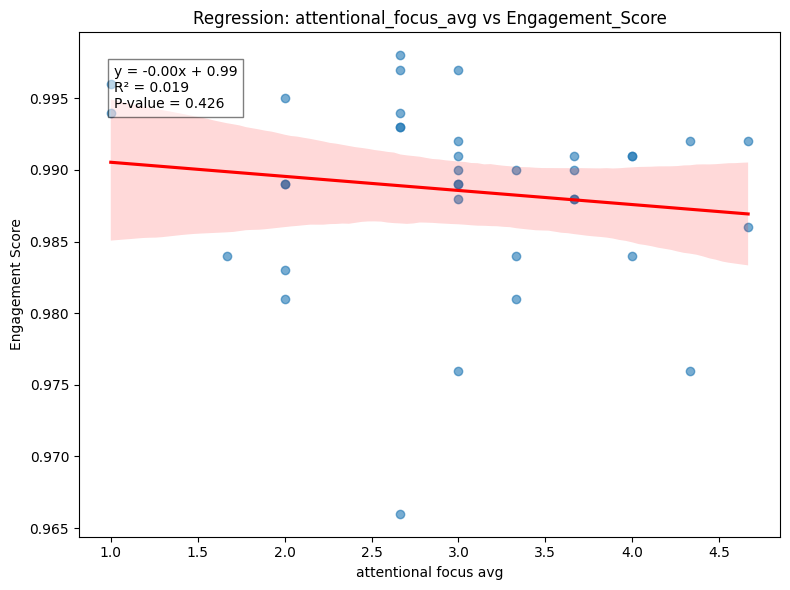

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

# === Load the dataset ===
df = pd.read_excel(r'C:\Users\bmoha\Desktop\DataCollection\SumTotal.xlsx')

# === Define target and predictors ===
target = 'Engagement_Score'
predictors = [
    'Speech_Balance_Ratio', 'Talkativeness_Human', 'PercentLookingAtChris',
    'Turn_Balance', 'Sentiment_Alignment', 'Hand DTW_Distance', 'rmssd',
    'Overall Experience Rating', 'age', 'attentional_focus_avg', '',
]

# === Clean data: drop NaNs in target and predictors ===
df = df[[target] + predictors].dropna()

# === Create regression plots for each predictor ===
for predictor in predictors:
    plt.figure(figsize=(8, 6))
    sns.regplot(x=df[predictor], y=df[target], scatter_kws={'alpha':0.6}, line_kws={"color": "red"})
    
    # Compute stats
    slope, intercept, r_value, p_value, std_err = stats.linregress(df[predictor], df[target])
    
    # Annotation text
    eqn = f"y = {slope:.2f}x + {intercept:.2f}"
    r2 = r_value**2
    annotation = f"{eqn}\nR² = {r2:.3f}\nP-value = {p_value:.3f}"
    
    # Plot annotation
    plt.annotate(annotation, xy=(0.05, 0.85), xycoords='axes fraction', fontsize=10, bbox=dict(facecolor='white', alpha=0.5))
    
    plt.title(f'Regression: {predictor} vs {target}')
    plt.xlabel(predictor.replace('_', ' '))
    plt.ylabel(target.replace('_', ' '))
    plt.tight_layout()
    plt.savefig(f"regression_{predictor}_vs_{target}.png", dpi=300)
    plt.show()


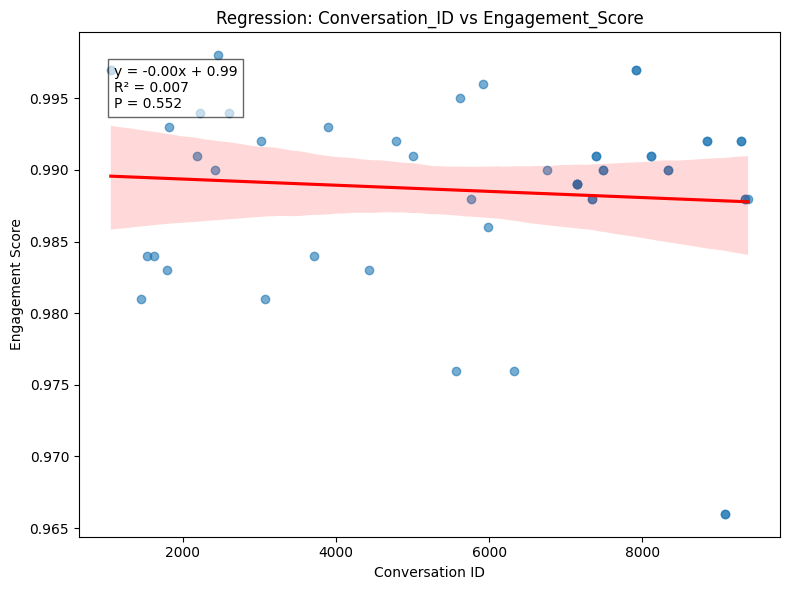

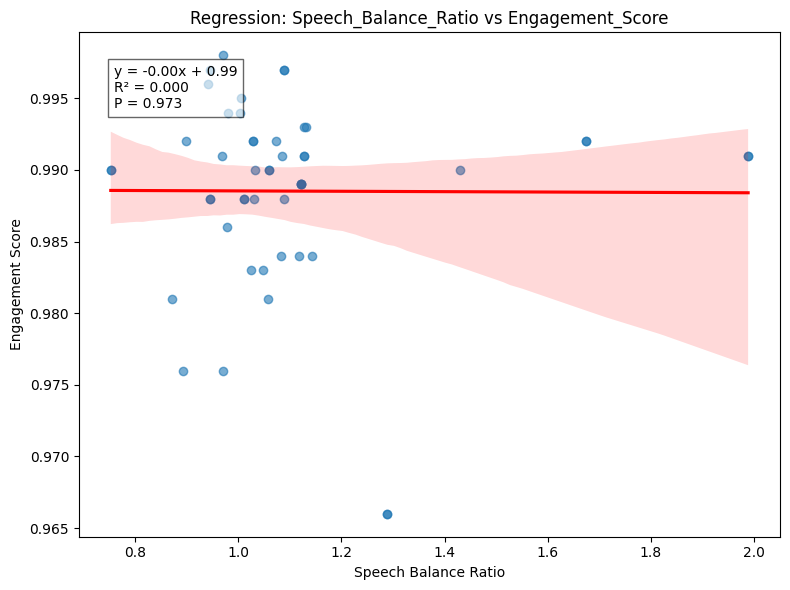

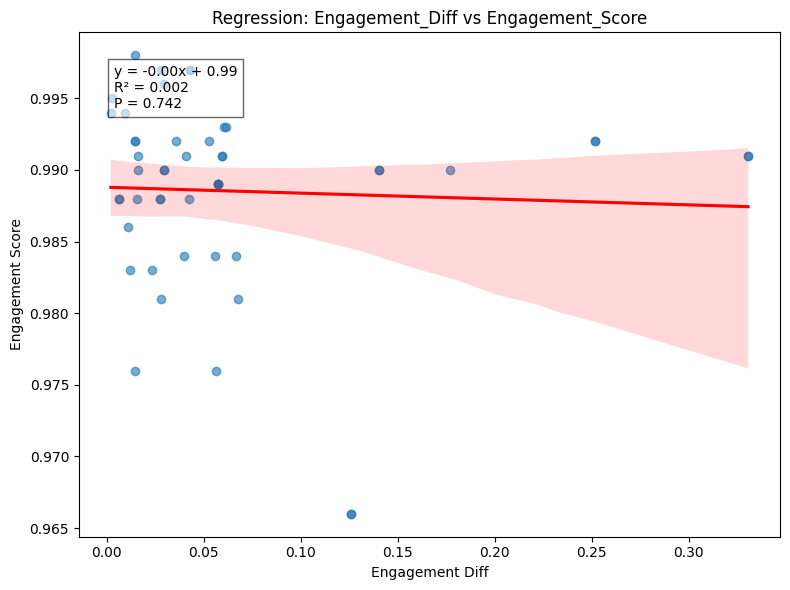

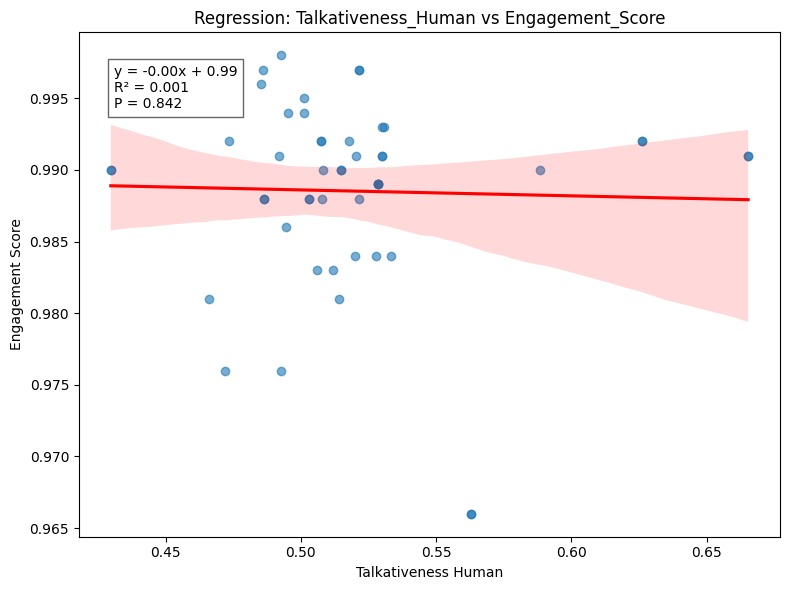

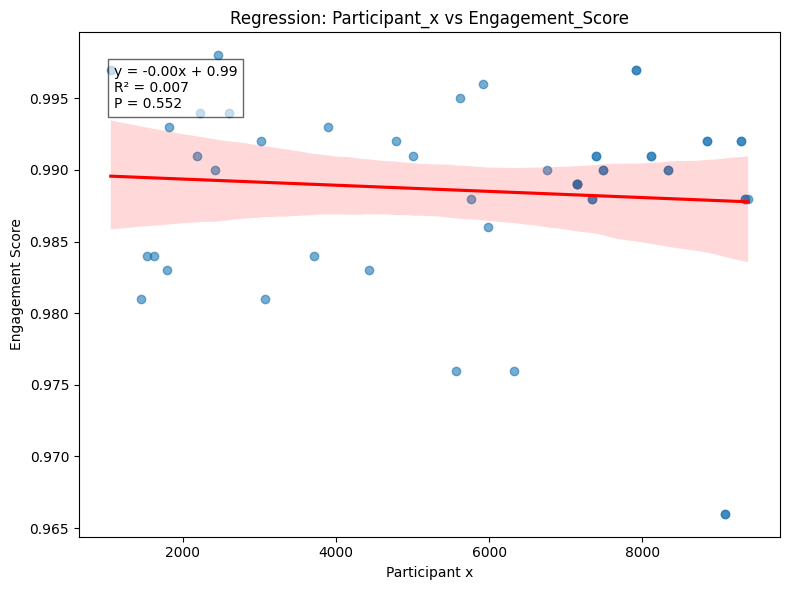

...

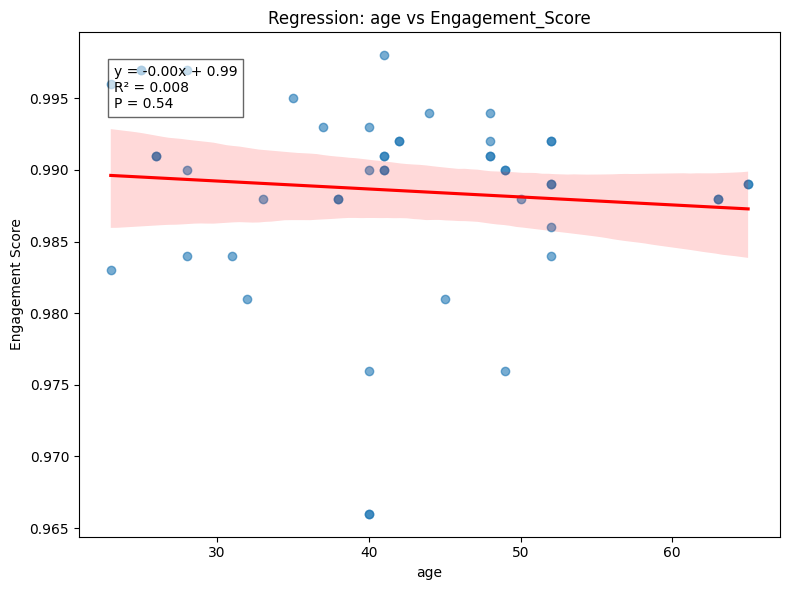

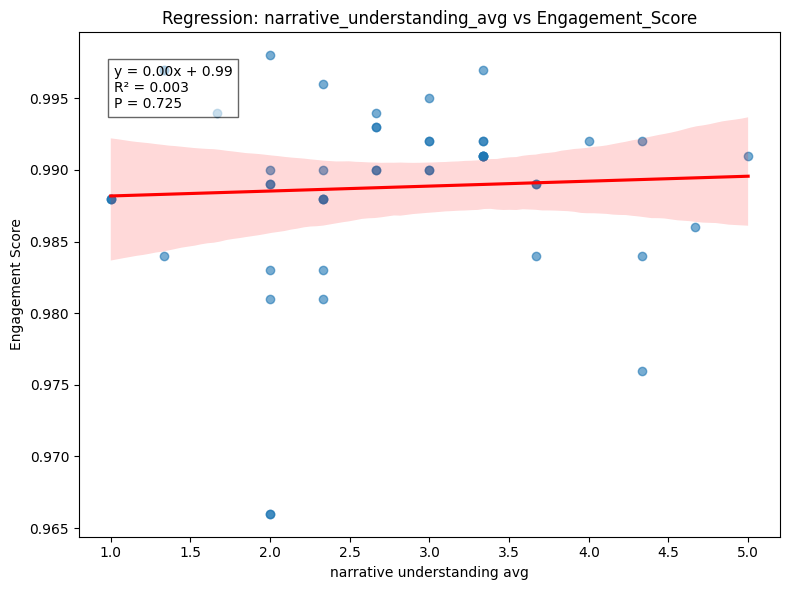

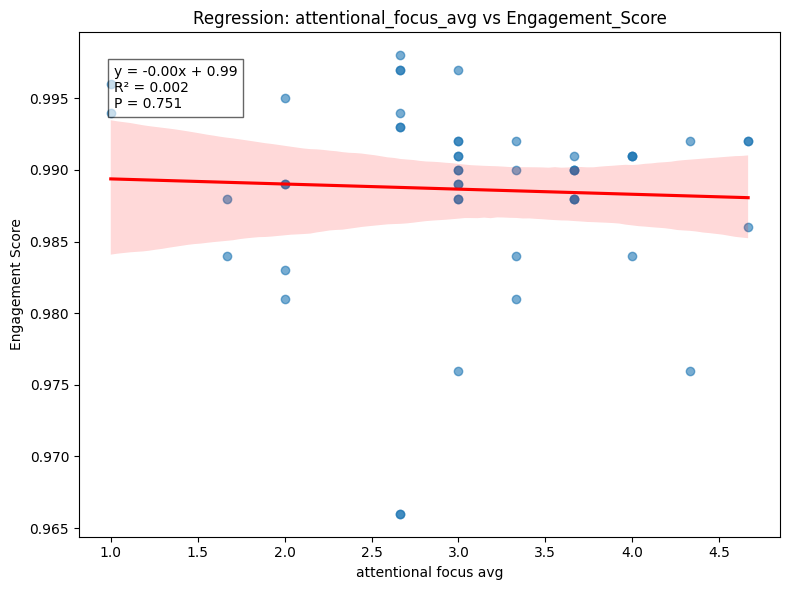

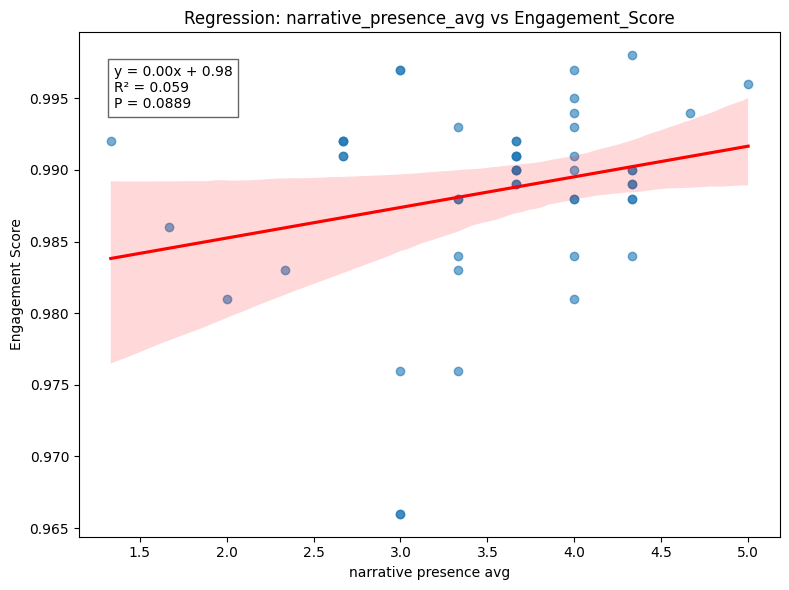

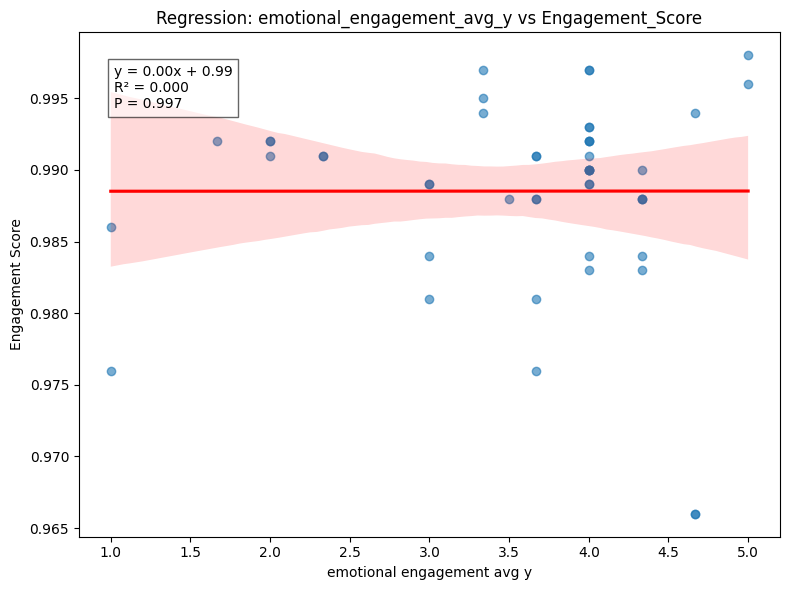

In [7]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import linregress



# === Define target variable ===
target = 'Engagement_Score'

# === Select numeric columns only and drop NaNs ===
numeric_df = df.select_dtypes(include='number')
if target not in numeric_df.columns:
    raise ValueError(f"⚠️ Target column '{target}' is not numeric or missing!")

numeric_df = numeric_df.dropna(subset=[target])

# === Loop through all numeric predictors ===
for column in numeric_df.columns:
    if column == target:
        continue  # skip the target itself

    x = numeric_df[column]
    y = numeric_df[target]

    # Drop NaNs for each pair
    data = pd.concat([x, y], axis=1).dropna()
    x = data[column]
    y = data[target]

    # Run linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    r_squared = r_value**2

    # === Plot ===
    plt.figure(figsize=(8, 6))
    sns.regplot(x=x, y=y, scatter_kws={'alpha':0.6}, line_kws={"color": "red"})

    # === Annotation ===
    equation = f"y = {slope:.2f}x + {intercept:.2f}"
    annotation = f"{equation}\nR² = {r_squared:.3f}\nP = {p_value:.3g}"
    plt.annotate(annotation, xy=(0.05, 0.85), xycoords='axes fraction',
                 fontsize=10, bbox=dict(facecolor='white', alpha=0.6))

    # === Titles ===
    plt.title(f'Regression: {column} vs {target}')
    plt.xlabel(column.replace("_", " "))
    plt.ylabel(target.replace("_", " "))
    plt.tight_layout()
    plt.savefig(f"regression_{column}_vs_{target}.png", dpi=300)
    plt.show()


In [6]:

import pandas as pd

# Load the Excel file
df = pd.read_excel(r"C:\Users\bmoha\Desktop\DataCollection\SumTotal.xlsx")

print("🧾 Column Names:")
for col in df.columns:
    print(f"• {col}")

🧾 Column Names:
• Conversation_ID
• Speech_Balance_Ratio
• Engagement_Diff
• Talkativeness_Human
• Participant_x
• PercentLookingAtChris
• TotalFramesCompared
• TimeStart
• TimeEnd
• InteractionDurationSeconds
• Total_Turns
• Human_Turns
• AI_Turns
• Turn_Balance
• Sentiment_Alignment
• Overlap_Ratio From Voice
• Engagement_Score
• Group
• Hand DTW_Distance
• Participant
• AverageHeadSync
• NumStreaks
• TotalGazeTime
• AverageGazeDuration
• LongestStreak
• city
• n_hr_samples
• mean_hr
• std_hr
• min_hr
• max_hr
• range_hr
• hr_diff_mean
• hr_diff_std
• hr_max_jump
• duration_minutes
• mean_acc
• std_acc
• max_acc
• min_acc
• range_acc
• n_acc_samples
• gender_x
• overlap_score
• mean_ibi
• std_ibi
• rmssd
• n_ibi_samples
• gender_y
• Overall Experience Rating
• Session Duration (mins)
• age
• narrative_understanding_avg
• attentional_focus_avg
• narrative_presence_avg
• emotional_engagement_avg_y


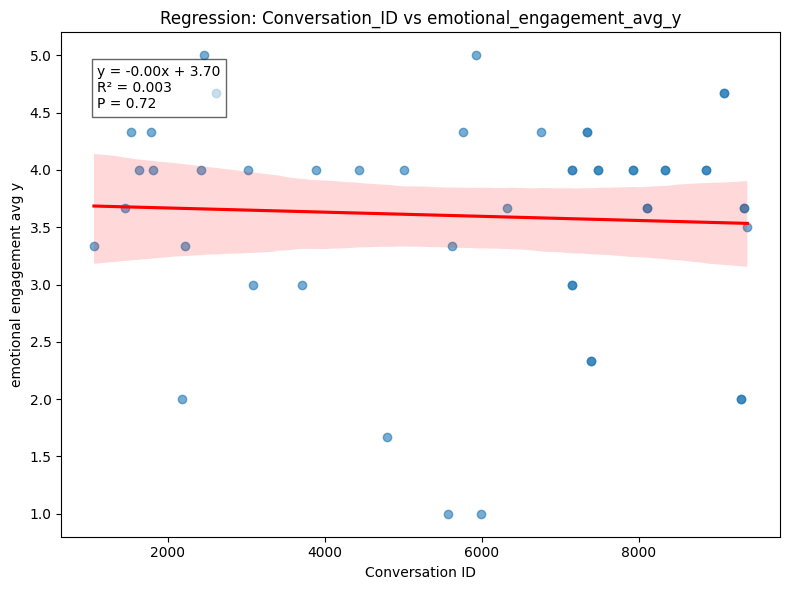

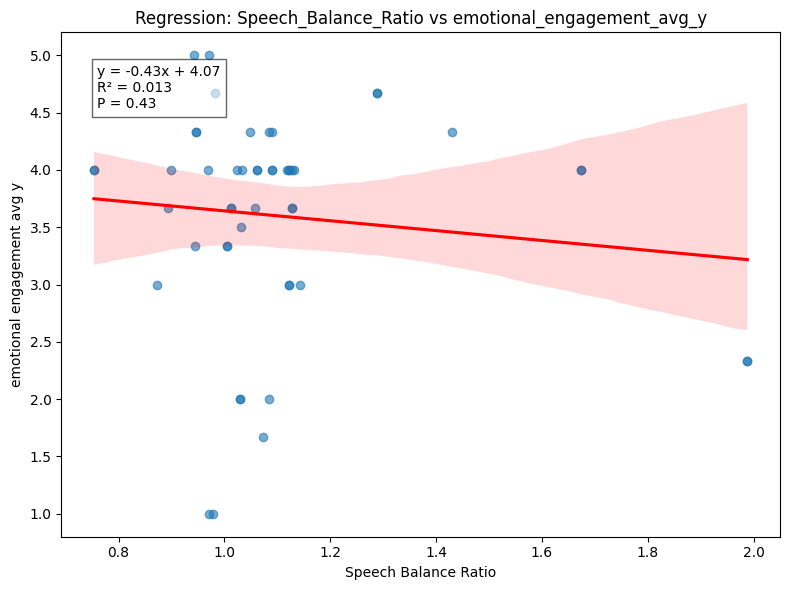

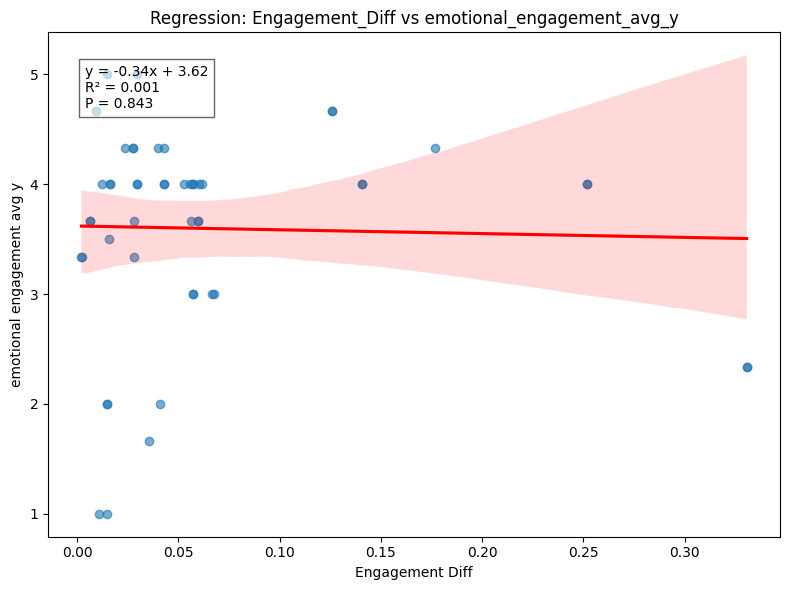

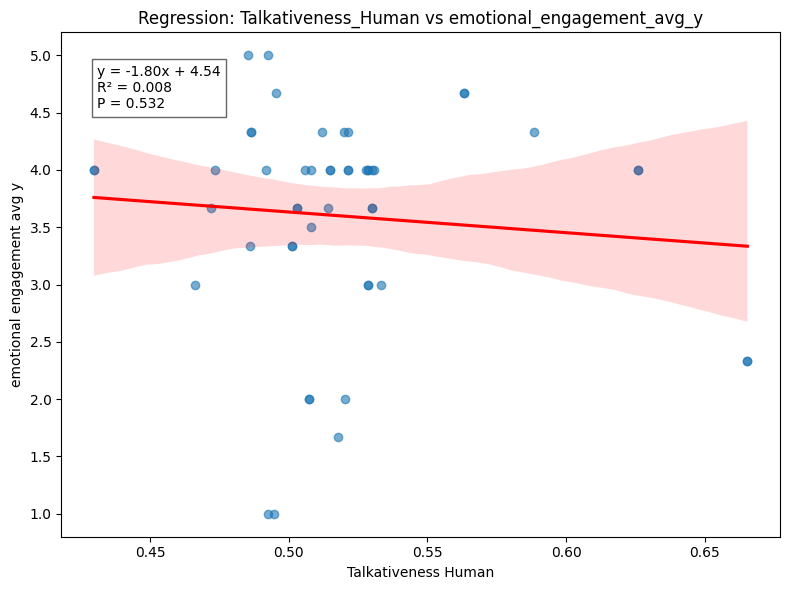

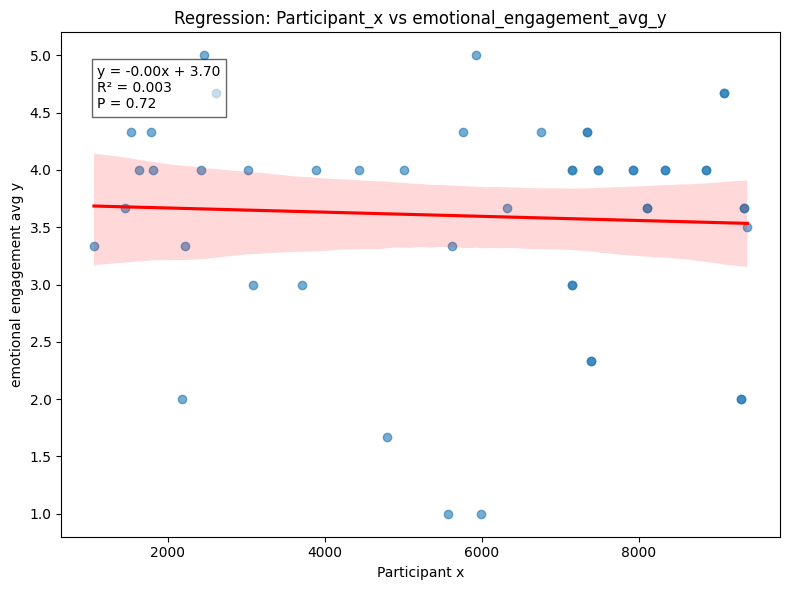

...

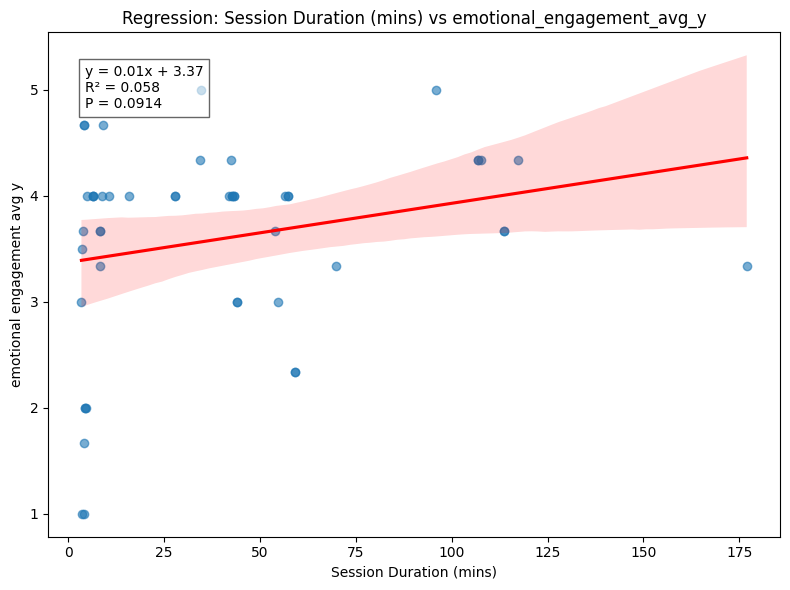

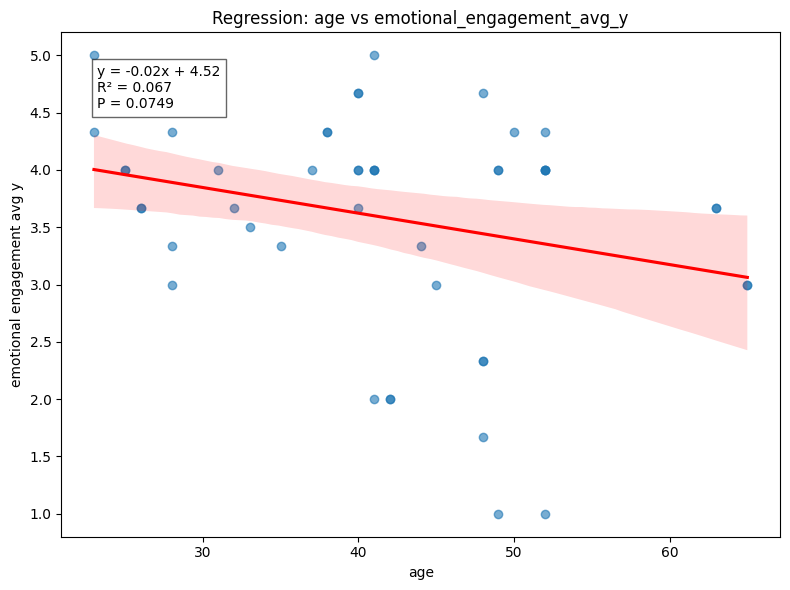

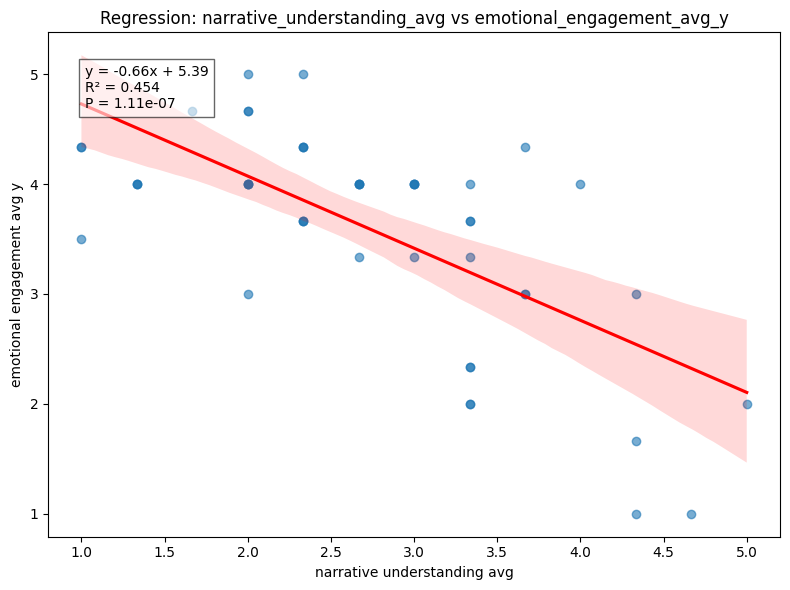

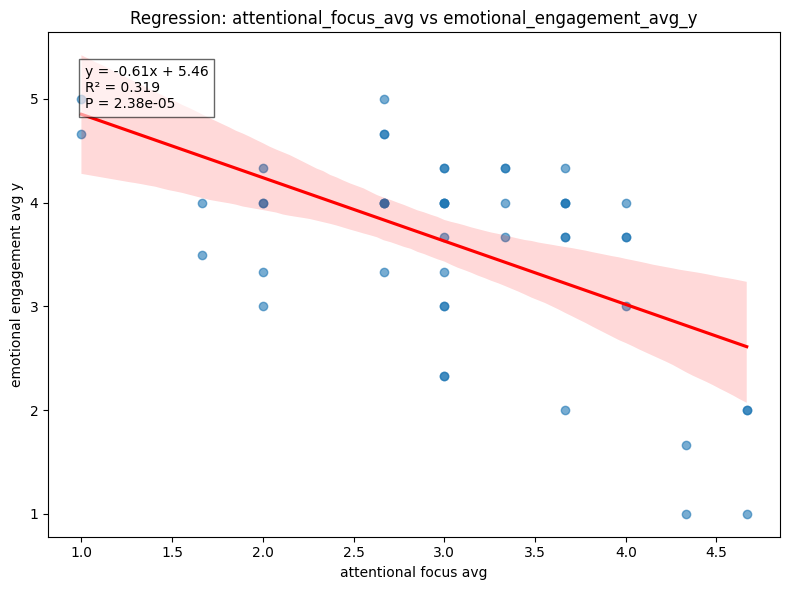

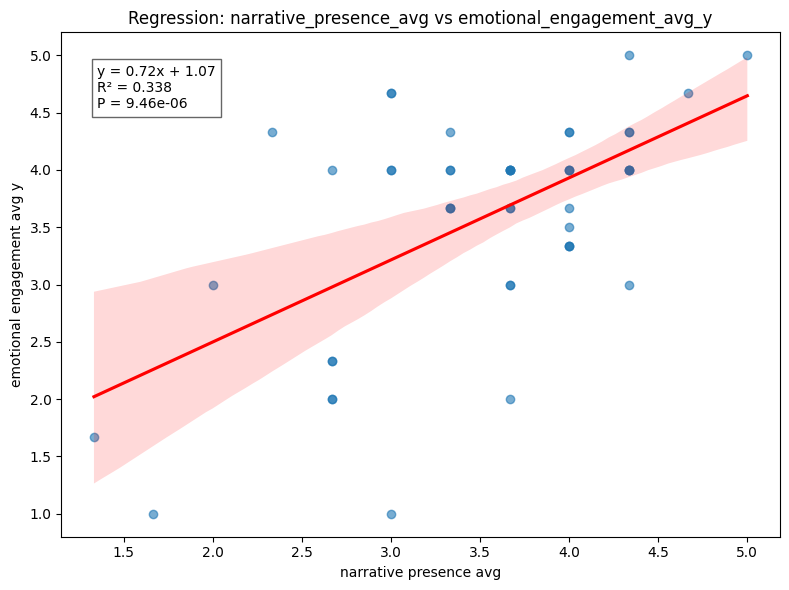

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import linregress



# === Define target variable ===
target = 'emotional_engagement_avg_y'

# === Select numeric columns only and drop NaNs ===
numeric_df = df.select_dtypes(include='number')
if target not in numeric_df.columns:
    raise ValueError(f"⚠️ Target column '{target}' is not numeric or missing!")

numeric_df = numeric_df.dropna(subset=[target])

# === Loop through all numeric predictors ===
for column in numeric_df.columns:
    if column == target:
        continue  # skip the target itself

    x = numeric_df[column]
    y = numeric_df[target]

    # Drop NaNs for each pair
    data = pd.concat([x, y], axis=1).dropna()
    x = data[column]
    y = data[target]

    # Run linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    r_squared = r_value**2

    # === Plot ===
    plt.figure(figsize=(8, 6))
    sns.regplot(x=x, y=y, scatter_kws={'alpha':0.6}, line_kws={"color": "red"})

    # === Annotation ===
    equation = f"y = {slope:.2f}x + {intercept:.2f}"
    annotation = f"{equation}\nR² = {r_squared:.3f}\nP = {p_value:.3g}"
    plt.annotate(annotation, xy=(0.05, 0.85), xycoords='axes fraction',
                 fontsize=10, bbox=dict(facecolor='white', alpha=0.6))

    # === Titles ===
    plt.title(f'Regression: {column} vs {target}')
    plt.xlabel(column.replace("_", " "))
    plt.ylabel(target.replace("_", " "))
    plt.tight_layout()
    plt.savefig(f"regression_{column}_vs_{target}.png", dpi=300)
    plt.show()


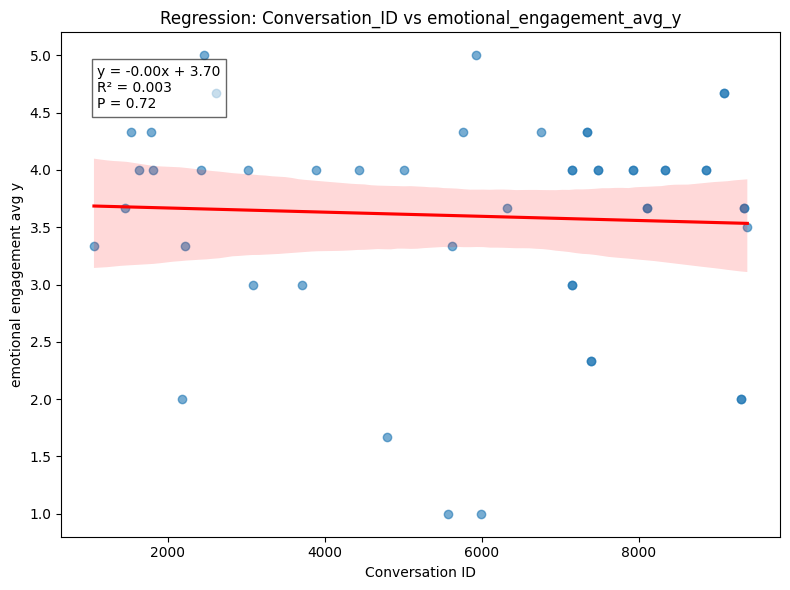

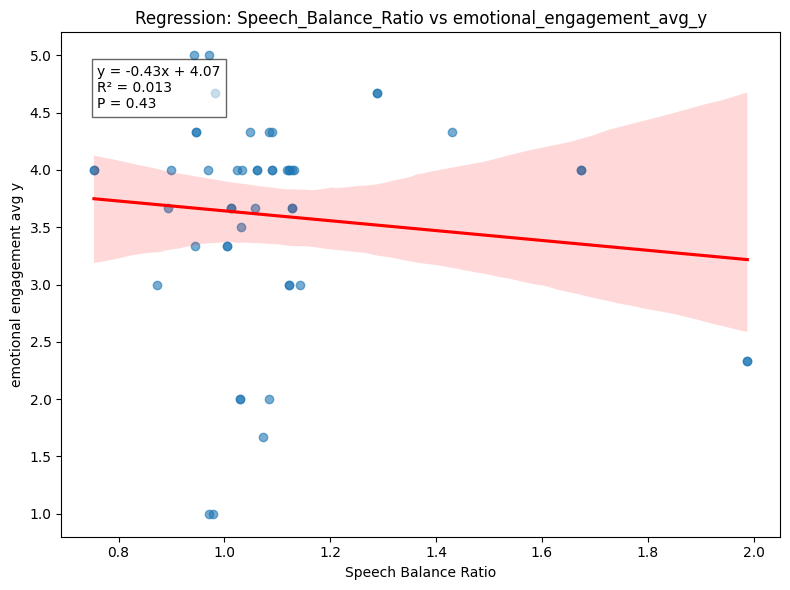

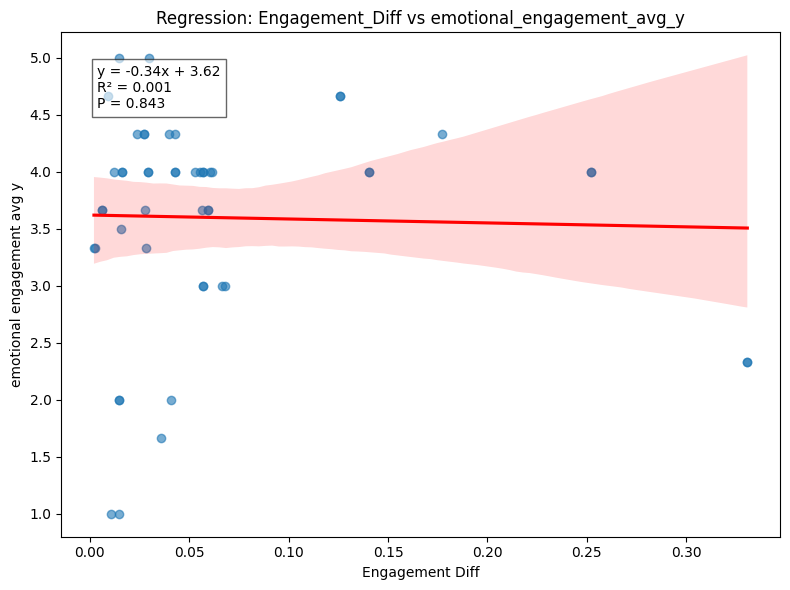

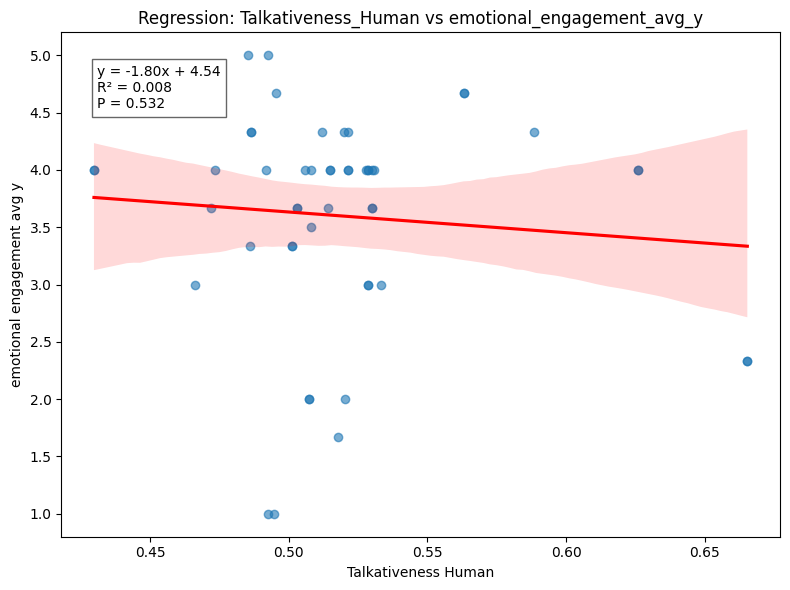

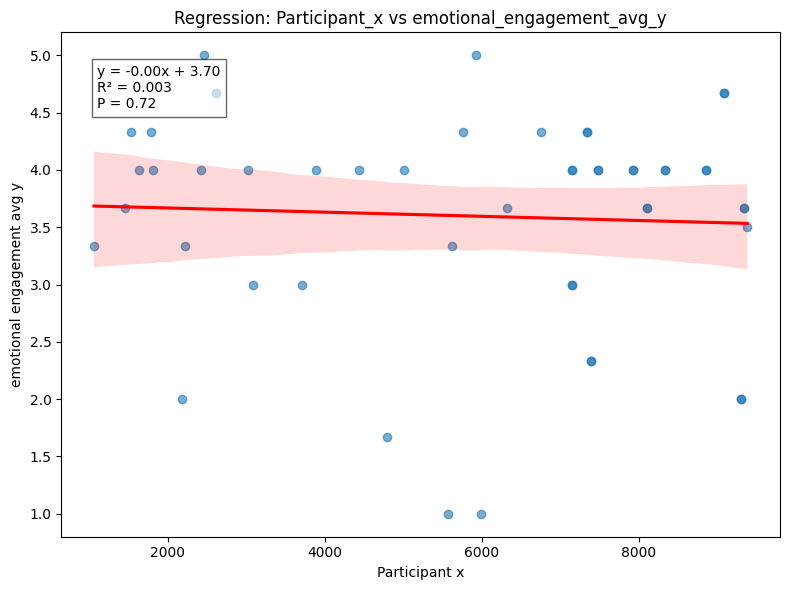

...

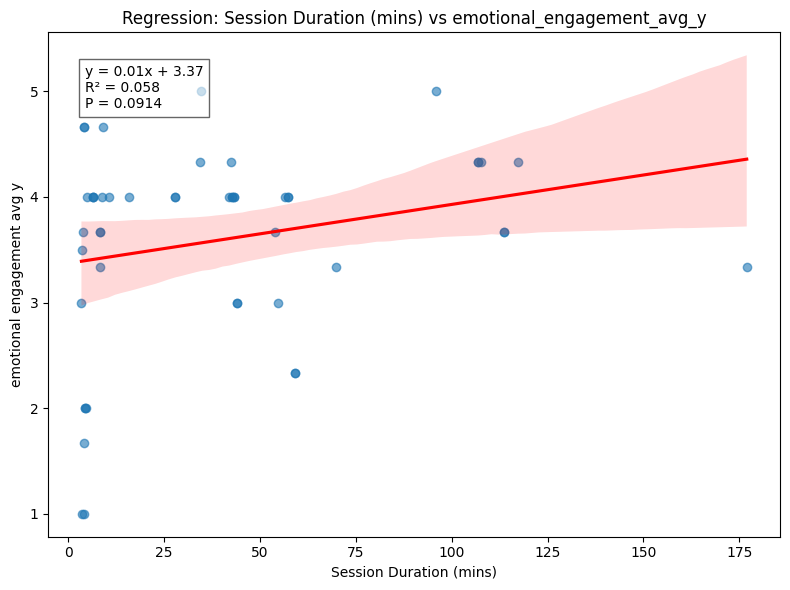

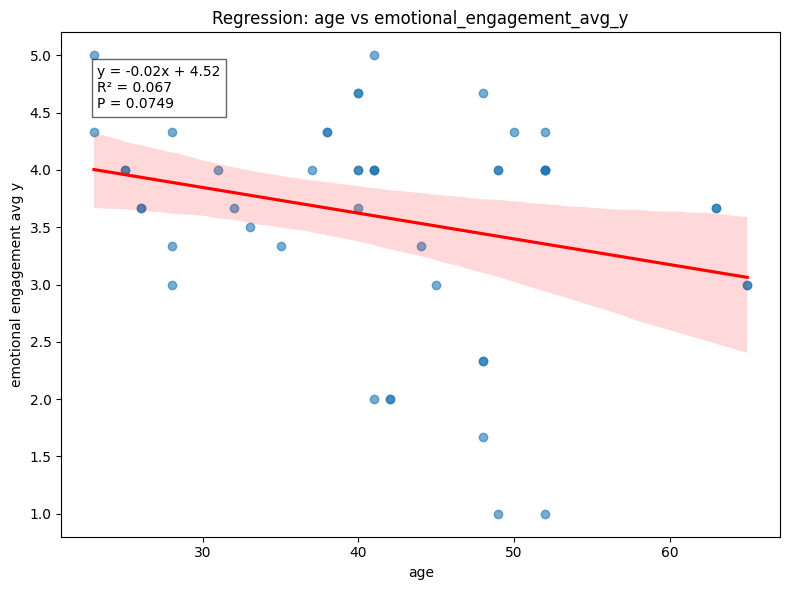

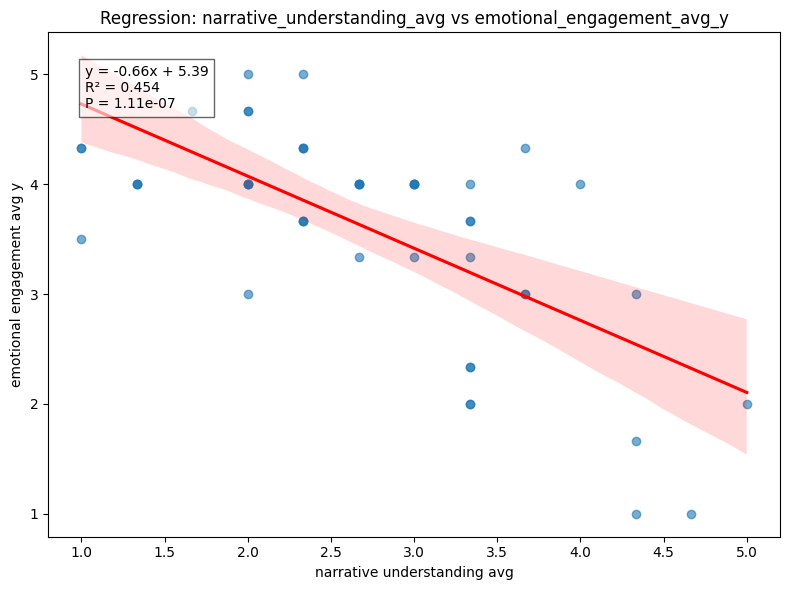

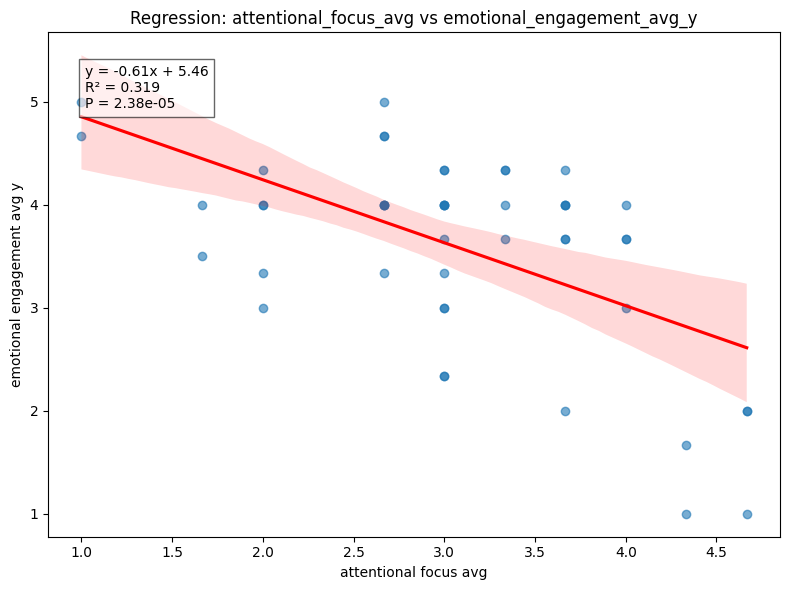

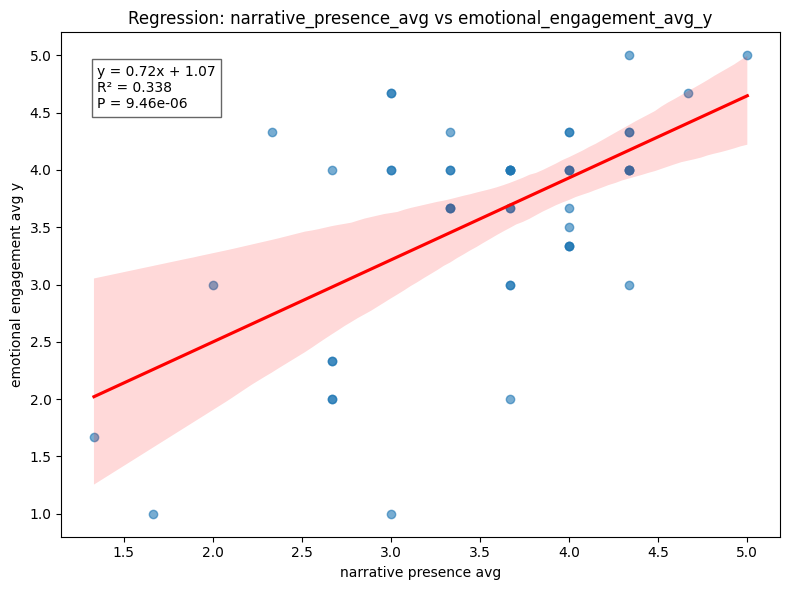


✅ Statistically Significant Regressions (p < 0.05):
                  Predictor     Slope  Intercept       R²      P-Value
              overlap_score  0.385721   2.450933 0.295749 2.868198e-04
  Overall Experience Rating  0.507946   1.079644 0.430458 3.093312e-07
narrative_understanding_avg -0.656097   5.385000 0.454147 1.112176e-07
      attentional_focus_avg -0.611145   5.463446 0.318818 2.378043e-05
     narrative_presence_avg  0.716016   1.066745 0.338223 9.460259e-06


In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import linregress

# === Load the dataset ===


# === Define target variable ===
target = 'emotional_engagement_avg_y'

# === Select numeric columns only and drop NaNs for target ===
numeric_df = df.select_dtypes(include='number')
if target not in numeric_df.columns:
    raise ValueError(f"⚠️ Target column '{target}' is not numeric or missing!")

numeric_df = numeric_df.dropna(subset=[target])

# === Store significant results ===
significant_results = []

# === Loop through all numeric predictors ===
for column in numeric_df.columns:
    if column == target:
        continue  # skip the target itself

    x = numeric_df[column]
    y = numeric_df[target]

    # Drop NaNs for each pair
    data = pd.concat([x, y], axis=1).dropna()
    x = data[column]
    y = data[target]

    # Run linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    r_squared = r_value**2

    # Store if significant
    if p_value < 0.05:
        significant_results.append({
            "Predictor": column,
            "Slope": slope,
            "Intercept": intercept,
            "R²": r_squared,
            "P-Value": p_value
        })

    # === Plot ===
    plt.figure(figsize=(8, 6))
    sns.regplot(x=x, y=y, scatter_kws={'alpha':0.6}, line_kws={"color": "red"})

    # === Annotation ===
    equation = f"y = {slope:.2f}x + {intercept:.2f}"
    annotation = f"{equation}\nR² = {r_squared:.3f}\nP = {p_value:.3g}"
    plt.annotate(annotation, xy=(0.05, 0.85), xycoords='axes fraction',
                 fontsize=10, bbox=dict(facecolor='white', alpha=0.6))

    # === Titles ===
    plt.title(f'Regression: {column} vs {target}')
    plt.xlabel(column.replace("_", " "))
    plt.ylabel(target.replace("_", " "))
    plt.tight_layout()
    plt.savefig(f"regression_{column}_vs_{target}.png", dpi=300)
    plt.show()

# === Summary of Significant Regressions ===
if significant_results:
    print("\n✅ Statistically Significant Regressions (p < 0.05):")
    summary_df = pd.DataFrame(significant_results)
    print(summary_df.to_string(index=False))
else:
    print("\n⚠️ No statistically significant regressions found (p < 0.05).")


In [12]:
!pip install pandas statsmodels matplotlib seaborn


In [13]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.miscmodels.ordinal_model import OrderedModel
import matplotlib.pyplot as plt
import seaborn as sns



# === Set dependent variable (ensure it’s ordinal) ===
target = 'emotional_engagement_avg_y'
df = df.dropna(subset=[target])
df[target] = pd.Categorical(df[target], ordered=True)

# === Select numeric predictors only ===
numeric_cols = df.select_dtypes(include='number').columns.tolist()
numeric_cols = [col for col in numeric_cols if col != target]

# === Store significant results ===
significant_predictors = []

# === Loop through all predictors ===
for predictor in numeric_cols:
    temp_df = df[[target, predictor]].dropna()

    try:
        model = OrderedModel(temp_df[target], sm.add_constant(temp_df[[predictor]]), distr='logit')
        result = model.fit(method='bfgs', disp=False)
        p_val = result.pvalues[1]  # p-value for predictor
        coef = result.params[1]

        if p_val < 0.05:
            significant_predictors.append({
                'Predictor': predictor,
                'Coefficient': coef,
                'P-Value': p_val
            })

            print(f"✅ {predictor} — Significant")
            print(result.summary())
            print("\n" + "-"*80 + "\n")
        else:
            print(f"⛔ {predictor} — Not significant")

    except Exception as e:
        print(f"⚠️ Skipped {predictor} due to error: {e}")

# === Convert to DataFrame for visualization ===
sig_df = pd.DataFrame(significant_predictors).sort_values('P-Value')

# === Plot significant predictors ===
if not sig_df.empty:
    plt.figure(figsize=(10, 6))
    sns.barplot(data=sig_df, x='Coefficient', y='Predictor', palette='coolwarm', edgecolor='black')
    plt.title("📈 Significant Predictors of Emotional Engagement (Ordinal Regression)")
    for index, row in sig_df.iterrows():
        plt.text(row['Coefficient'], index, f"p={row['P-Value']:.3f}", va='center', ha='right' if row['Coefficient'] < 0 else 'left')
    plt.axvline(0, color='gray', linestyle='--')
    plt.tight_layout()
    plt.show()
else:
    print("❌ No significant predictors found.")


⚠️ Skipped Conversation_ID due to error: There should not be a constant in the model
⚠️ Skipped Speech_Balance_Ratio due to error: There should not be a constant in the model
⚠️ Skipped Engagement_Diff due to error: There should not be a constant in the model
⚠️ Skipped Talkativeness_Human due to error: There should not be a constant in the model
⚠️ Skipped Participant_x due to error: There should not be a constant in the model
⚠️ Skipped PercentLookingAtChris due to error: There should not be a constant in the model
⚠️ Skipped TotalFramesCompared due to error: There should not be a constant in the model
⚠️ Skipped TimeStart due to error: There should not be a constant in the model
⚠️ Skipped TimeEnd due to error: There should not be a constant in the model
⚠️ Skipped InteractionDurationSeconds due to error: There should not be a constant in the model
⚠️ Skipped Total_Turns due to error: There should not be a constant in the model
⚠️ Skipped Human_Turns due to error: There should not b

KeyError: 'P-Value'

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Conversation_ID — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Speech_Balance_Ratio — Not significant
⛔ Engagement_Diff — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Talkativeness_Human — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Participant_x — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


✅ PercentLookingAtChris — Significant
                                 OrderedModel Results                                 
Dep. Variable:     emotional_engagement_avg_y   Log-Likelihood:                -104.39
Model:                           OrderedModel   AIC:                             232.8
Method:                    Maximum Likelihood   BIC:                             255.7
Date:                        Fri, 29 Aug 2025                                         
Time:                                11:24:36                                         
No. Observations:                          50                                         
Df Residuals:                              38                                         
Df Model:                                   1                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ TotalFramesCompared — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ TimeStart — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ TimeEnd — Not significant
⛔ InteractionDurationSeconds — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Total_Turns — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Human_Turns — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ AI_Turns — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Turn_Balance — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:595: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating 

⛔ Sentiment_Alignment — Not significant
⛔ Overlap_Ratio From Voice — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Engagement_Score — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Hand DTW_Distance — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Participant — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

✅ AverageHeadSync — Significant
                                 OrderedModel Results                                 
Dep. Variable:     emotional_engagement_avg_y   Log-Likelihood:                -104.34
Model:                           OrderedModel   AIC:                             232.7
Method:                    Maximum Likelihood   BIC:                             255.6
Date:                        Fri, 29 Aug 2025                                         
Time:                                11:24:39                                         
No. Observations:                          50                                         
Df Residuals:                              38                                         
Df Model:                                   1                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
A

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ TotalGazeTime — Not significant
⛔ AverageGazeDuration — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ LongestStreak — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ n_hr_samples — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ mean_hr — Not significant
⛔ std_hr — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ min_hr — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ max_hr — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ range_hr — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ hr_diff_mean — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ hr_diff_std — Not significant
⛔ hr_max_jump — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ duration_minutes — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ mean_acc — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ std_acc — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ max_acc — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ min_acc — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ range_acc — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ n_acc_samples — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


✅ overlap_score — Significant
                                 OrderedModel Results                                 
Dep. Variable:     emotional_engagement_avg_y   Log-Likelihood:                -79.070
Model:                           OrderedModel   AIC:                             182.1
Method:                    Maximum Likelihood   BIC:                             202.4
Date:                        Fri, 29 Aug 2025                                         
Time:                                11:24:44                                         
No. Observations:                          40                                         
Df Residuals:                              28                                         
Df Model:                                   1                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
ove

C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ mean_ibi — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treati

⛔ std_ibi — Not significant
⛔ rmssd — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\miscmodels\ordinal_model.py:372: RuntimeWarning: divide by zero encountered in log
  np.log(np.diff(params[:-1]))))
C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\tools\numdiff.py:157: RuntimeWarning: invalid value encountered in add
  grad[k, :] = (f(*((x+

⛔ n_ibi_samples — Not significant
⛔ Overall Experience Rating — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Session Duration (mins) — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ age — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


✅ narrative_understanding_avg — Significant
                                 OrderedModel Results                                 
Dep. Variable:     emotional_engagement_avg_y   Log-Likelihood:                -91.812
Model:                           OrderedModel   AIC:                             207.6
Method:                    Maximum Likelihood   BIC:                             230.3
Date:                        Fri, 29 Aug 2025                                         
Time:                                11:24:46                                         
No. Observations:                          49                                         
Df Residuals:                              37                                         
Df Model:                                   1                                         
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


✅ attentional_focus_avg — Significant
                                 OrderedModel Results                                 
Dep. Variable:     emotional_engagement_avg_y   Log-Likelihood:                -97.514
Model:                           OrderedModel   AIC:                             219.0
Method:                    Maximum Likelihood   BIC:                             241.7
Date:                        Fri, 29 Aug 2025                                         
Time:                                11:24:47                                         
No. Observations:                          49                                         
Df Residuals:                              37                                         
Df Model:                                   1                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\2923681857.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sig_df, x='Coefficient', y='Predictor', palette='coolwarm', edgecolor='black

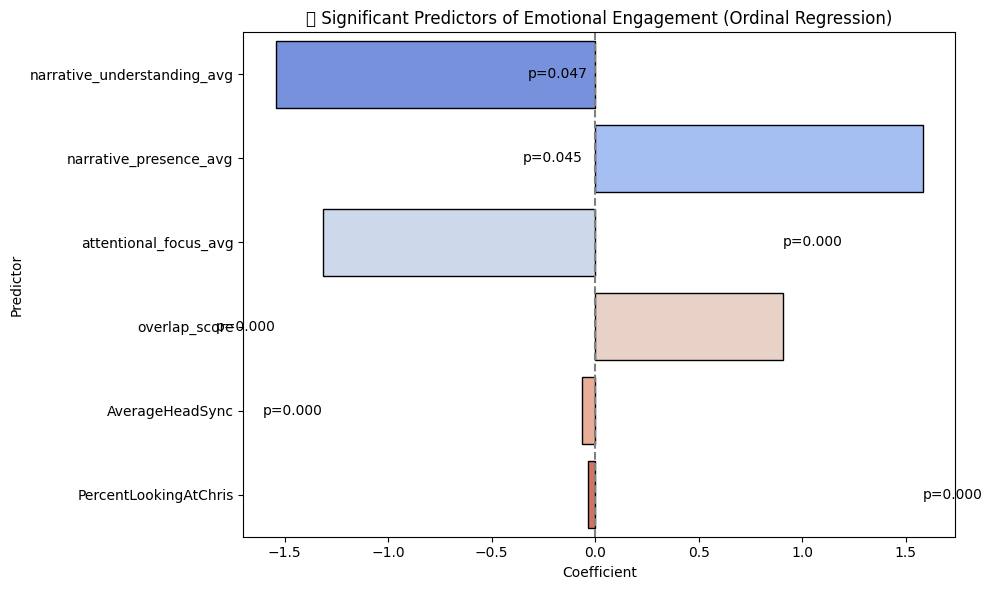

In [14]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.miscmodels.ordinal_model import OrderedModel
import matplotlib.pyplot as plt
import seaborn as sns

# === Load dataset ===


# === Dependent variable ===
target = 'emotional_engagement_avg_y'
df = df.dropna(subset=[target])
df[target] = pd.Categorical(df[target], ordered=True)

# === Numeric predictors only ===
numeric_cols = df.select_dtypes(include='number').columns.tolist()
numeric_cols = [col for col in numeric_cols if col != target]

# === Store significant results ===
significant_predictors = []

# === Loop over numeric predictors ===
for predictor in numeric_cols:
    temp_df = df[[target, predictor]].dropna()

    try:
        # NO constant added here
        model = OrderedModel(temp_df[target], temp_df[[predictor]], distr='logit')
        result = model.fit(method='bfgs', disp=False)

        p_val = result.pvalues[0]
        coef = result.params[0]

        if p_val < 0.05:
            significant_predictors.append({
                'Predictor': predictor,
                'Coefficient': coef,
                'P-Value': p_val
            })

            print(f"✅ {predictor} — Significant")
            print(result.summary())
            print("\n" + "-"*80 + "\n")
        else:
            print(f"⛔ {predictor} — Not significant")

    except Exception as e:
        print(f"⚠️ Skipped {predictor} due to error: {e}")

# === Visualize Significant Predictors ===
sig_df = pd.DataFrame(significant_predictors).sort_values('P-Value')

if not sig_df.empty:
    plt.figure(figsize=(10, 6))
    sns.barplot(data=sig_df, x='Coefficient', y='Predictor', palette='coolwarm', edgecolor='black')
    plt.title("📊 Significant Predictors of Emotional Engagement (Ordinal Regression)")
    for index, row in sig_df.iterrows():
        plt.text(row['Coefficient'], index, f"p={row['P-Value']:.3f}",
                 va='center', ha='right' if row['Coefficient'] < 0 else 'left')
    plt.axvline(0, color='gray', linestyle='--')
    plt.tight_layout()
    plt.show()
else:
    print("❌ No significant predictors found.")


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Conversation_ID — Not significant
⛔ Speech_Balance_Ratio — Not significant
⛔ Engagement_Diff — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Talkativeness_Human — Not significant
⛔ Participant_x — Not significant
✅ PercentLookingAtChris — Significant
                                 OrderedModel Results                                
Dep. Variable:     Overall Experience Rating   Log-Likelihood:                -69.831
Model:                          OrderedModel   AIC:                             151.7
Method:                   Maximum Likelihood   BIC:                             163.0
Date:                       Fri, 29 Aug 2025                                         
Time:                               11:34:39                                         
No. Observations:                         49                                         
Df Residuals:                             43                                         
Df Model:                                  1                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
------------------------

C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treati

⛔ TotalFramesCompared — Not significant
⛔ TimeStart — Not significant
✅ TimeEnd — Significant
                                 OrderedModel Results                                
Dep. Variable:     Overall Experience Rating   Log-Likelihood:                -72.788
Model:                          OrderedModel   AIC:                             157.6
Method:                   Maximum Likelihood   BIC:                             168.9
Date:                       Fri, 29 Aug 2025                                         
Time:                               11:34:39                                         
No. Observations:                         49                                         
Df Residuals:                             43                                         
Df Model:                                  1                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ InteractionDurationSeconds — Not significant
⛔ Total_Turns — Not significant
⛔ Human_Turns — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:595: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating 

⛔ AI_Turns — Not significant
⛔ Turn_Balance — Not significant
⛔ Sentiment_Alignment — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Overlap_Ratio From Voice — Not significant
⛔ Engagement_Score — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treati

⛔ Hand DTW_Distance — Not significant
⛔ Participant — Not significant
⛔ AverageHeadSync — Not significant
⛔ NumStreaks — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ TotalGazeTime — Not significant
⛔ AverageGazeDuration — Not significant
⛔ LongestStreak — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ n_hr_samples — Not significant
⛔ mean_hr — Not significant
⛔ std_hr — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ min_hr — Not significant
⛔ max_hr — Not significant
⛔ range_hr — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ hr_diff_mean — Not significant
⛔ hr_diff_std — Not significant
⛔ hr_max_jump — Not significant
⛔ duration_minutes — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ mean_acc — Not significant
⛔ std_acc — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treati

⛔ max_acc — Not significant
⛔ min_acc — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treati

⛔ range_acc — Not significant
⛔ n_acc_samples — Not significant
✅ overlap_score — Significant
                                 OrderedModel Results                                
Dep. Variable:     Overall Experience Rating   Log-Likelihood:                -51.325
Model:                          OrderedModel   AIC:                             114.7
Method:                   Maximum Likelihood   BIC:                             124.6
Date:                       Fri, 29 Aug 2025                                         
Time:                               11:34:42                                         
No. Observations:                         39                                         
Df Residuals:                             33                                         
Df Model:                                  1                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------

C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: M

⛔ mean_ibi — Not significant
⛔ std_ibi — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ rmssd — Not significant
⛔ n_ibi_samples — Not significant
⛔ Session Duration (mins) — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ age — Not significant
✅ narrative_understanding_avg — Significant
                                 OrderedModel Results                                
Dep. Variable:     Overall Experience Rating   Log-Likelihood:                -70.809
Model:                          OrderedModel   AIC:                             153.6
Method:                   Maximum Likelihood   BIC:                             164.8
Date:                       Fri, 29 Aug 2025                                         
Time:                               11:34:42                                         
No. Observations:                         48                                         
Df Residuals:                             42                                         
Df Model:                                  1                                         
                                  coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1741625670.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sig_df, x='Coefficient', y='Predictor', palette='coolwarm', edgecolor='black

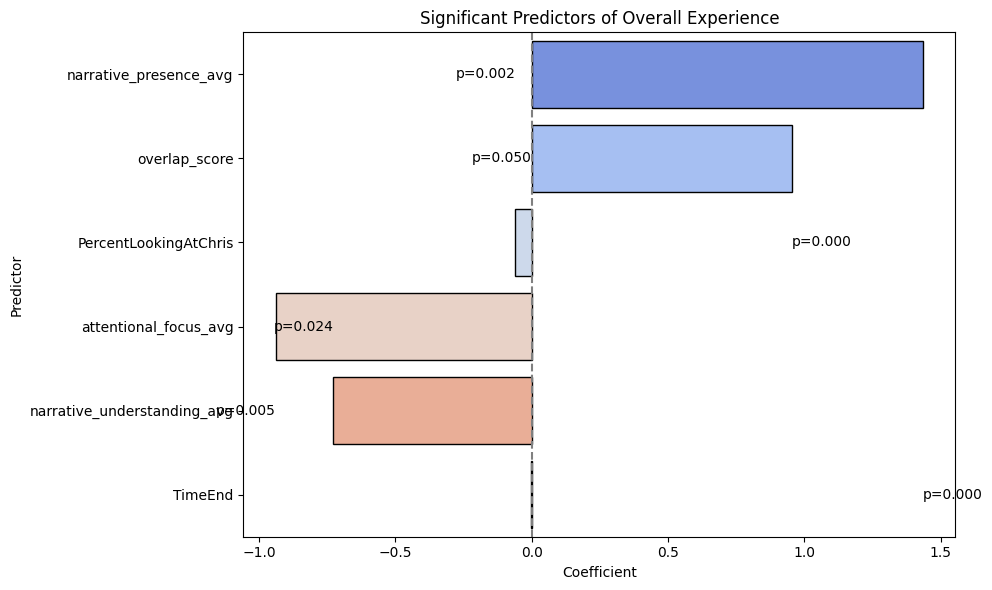

In [17]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.miscmodels.ordinal_model import OrderedModel
import matplotlib.pyplot as plt
import seaborn as sns

# === Load dataset ===


# === Dependent variable ===
target = 'Overall Experience Rating'
df = df.dropna(subset=[target])
df[target] = pd.Categorical(df[target], ordered=True)

# === Numeric predictors only ===
numeric_cols = df.select_dtypes(include='number').columns.tolist()
numeric_cols = [col for col in numeric_cols if col != target]

# === Store significant results ===
significant_predictors = []

# === Loop over numeric predictors ===
for predictor in numeric_cols:
    temp_df = df[[target, predictor]].dropna()

    try:
        # NO constant added here
        model = OrderedModel(temp_df[target], temp_df[[predictor]], distr='logit')
        result = model.fit(method='bfgs', disp=False)

        p_val = result.pvalues[0]
        coef = result.params[0]

        if p_val < 0.05:
            significant_predictors.append({
                'Predictor': predictor,
                'Coefficient': coef,
                'P-Value': p_val
            })

            print(f"✅ {predictor} — Significant")
            print(result.summary())
            print("\n" + "-"*80 + "\n")
        else:
            print(f"⛔ {predictor} — Not significant")

    except Exception as e:
        print(f"⚠️ Skipped {predictor} due to error: {e}")

# === Visualize Significant Predictors ===
sig_df = pd.DataFrame(significant_predictors).sort_values('P-Value')

if not sig_df.empty:
    plt.figure(figsize=(10, 6))
    sns.barplot(data=sig_df, x='Coefficient', y='Predictor', palette='coolwarm', edgecolor='black')
    plt.title("Significant Predictors of Overall Experience")
    for index, row in sig_df.iterrows():
        plt.text(row['Coefficient'], index, f"p={row['P-Value']:.3f}",
                 va='center', ha='right' if row['Coefficient'] < 0 else 'left')
    plt.axvline(0, color='gray', linestyle='--')
    plt.tight_layout()
    plt.show()
else:
    print("❌ No significant predictors found.")

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Conversation_ID — Not significant
⛔ Speech_Balance_Ratio — Not significant
⛔ Engagement_Diff — Not significant
⛔ Talkativeness_Human — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Participant_x — Not significant
⛔ PercentLookingAtChris — Not significant
⛔ TotalFramesCompared — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ TimeStart — Not significant
⛔ TimeEnd — Not significant
⛔ InteractionDurationSeconds — Not significant
⛔ Total_Turns — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Human_Turns — Not significant
⛔ AI_Turns — Not significant
⛔ Turn_Balance — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Sentiment_Alignment — Not significant
⛔ Overlap_Ratio From Voice — Not significant
⛔ Engagement_Score — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treati

⛔ Hand DTW_Distance — Not significant
⛔ Participant — Not significant
⛔ AverageHeadSync — Not significant
⛔ NumStreaks — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ TotalGazeTime — Not significant
⛔ AverageGazeDuration — Not significant
⛔ LongestStreak — Not significant
⛔ n_hr_samples — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ mean_hr — Not significant
⛔ std_hr — Not significant
⛔ min_hr — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ max_hr — Not significant
⛔ range_hr — Not significant
⛔ hr_diff_mean — Not significant
⛔ hr_diff_std — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ hr_max_jump — Not significant
⛔ duration_minutes — Not significant
⛔ mean_acc — Not significant
⛔ std_acc — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treati

⛔ max_acc — Not significant
⛔ min_acc — Not significant
⛔ range_acc — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treati

⛔ n_acc_samples — Not significant
⛔ mean_ibi — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treati

⛔ std_ibi — Not significant
⛔ rmssd — Not significant
⛔ n_ibi_samples — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Session Duration (mins) — Not significant
⛔ age — Not significant
✅ narrative_understanding_avg — Significant
                             OrderedModel Results                             
Dep. Variable:          overlap_score   Log-Likelihood:                -56.236
Model:                   OrderedModel   AIC:                             124.5
Method:            Maximum Likelihood   BIC:                             134.3
Date:                Fri, 29 Aug 2025                                         
Time:                        11:37:37                                         
No. Observations:                  38                                         
Df Residuals:                      32                                         
Df Model:                           1                                         
                                  coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1934420086.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

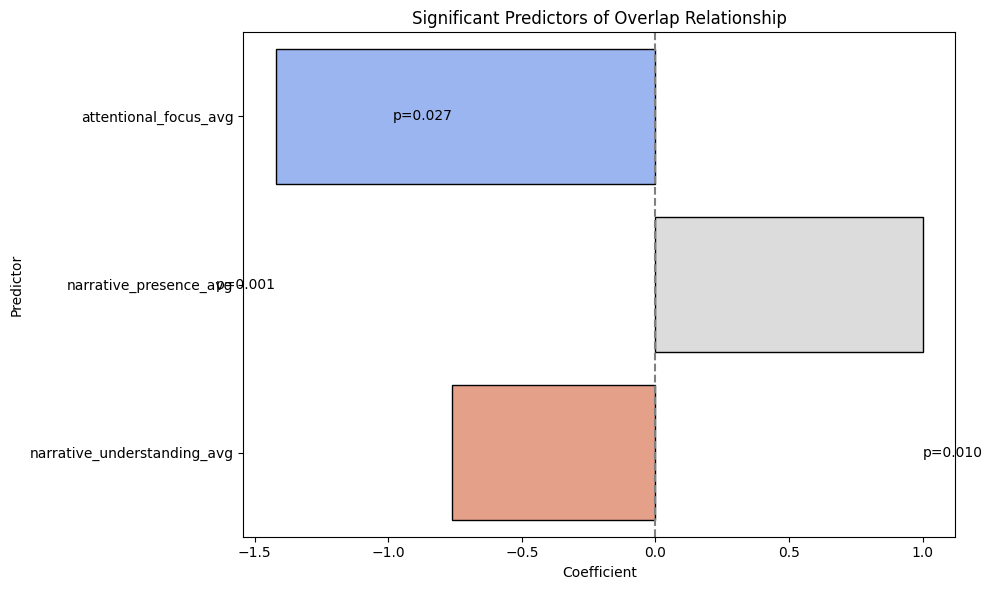

In [19]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.miscmodels.ordinal_model import OrderedModel
import matplotlib.pyplot as plt
import seaborn as sns

# === Load dataset ===


# === Dependent variable ===
target = 'overlap_score'
df = df.dropna(subset=[target])
df[target] = pd.Categorical(df[target], ordered=True)

# === Numeric predictors only ===
numeric_cols = df.select_dtypes(include='number').columns.tolist()
numeric_cols = [col for col in numeric_cols if col != target]

# === Store significant results ===
significant_predictors = []

# === Loop over numeric predictors ===
for predictor in numeric_cols:
    temp_df = df[[target, predictor]].dropna()

    try:
        # NO constant added here
        model = OrderedModel(temp_df[target], temp_df[[predictor]], distr='logit')
        result = model.fit(method='bfgs', disp=False)

        p_val = result.pvalues[0]
        coef = result.params[0]

        if p_val < 0.05:
            significant_predictors.append({
                'Predictor': predictor,
                'Coefficient': coef,
                'P-Value': p_val
            })

            print(f"✅ {predictor} — Significant")
            print(result.summary())
            print("\n" + "-"*80 + "\n")
        else:
            print(f"⛔ {predictor} — Not significant")

    except Exception as e:
        print(f"⚠️ Skipped {predictor} due to error: {e}")

# === Visualize Significant Predictors ===
sig_df = pd.DataFrame(significant_predictors).sort_values('P-Value')

if not sig_df.empty:
    plt.figure(figsize=(10, 6))
    sns.barplot(data=sig_df, x='Coefficient', y='Predictor', palette='coolwarm', edgecolor='black')
    plt.title("Significant Predictors of Overlap Relationship")
    for index, row in sig_df.iterrows():
        plt.text(row['Coefficient'], index, f"p={row['P-Value']:.3f}",
                 va='center', ha='right' if row['Coefficient'] < 0 else 'left')
    plt.axvline(0, color='gray', linestyle='--')
    plt.tight_layout()
    plt.show()
else:
    print("❌ No significant predictors found.")

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Conversation_ID — Not significant
⛔ Speech_Balance_Ratio — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Engagement_Diff — Not significant
⛔ Talkativeness_Human — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Participant_x — Not significant
⛔ PercentLookingAtChris — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ TotalFramesCompared — Not significant
⛔ TimeStart — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ TimeEnd — Not significant
⛔ InteractionDurationSeconds — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Total_Turns — Not significant
⛔ Human_Turns — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ AI_Turns — Not significant
⛔ Turn_Balance — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Sentiment_Alignment — Not significant
⛔ Overlap_Ratio From Voice — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Engagement_Score — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Hand DTW_Distance — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Participant — Not significant
⛔ AverageHeadSync — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ NumStreaks — Not significant
⛔ TotalGazeTime — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ AverageGazeDuration — Not significant
✅ LongestStreak — Significant
                               OrderedModel Results                              
Dep. Variable:     attentional_focus_avg   Log-Likelihood:                -78.055
Model:                      OrderedModel   AIC:                             176.1
Method:               Maximum Likelihood   BIC:                             192.5
Date:                   Fri, 29 Aug 2025                                         
Time:                           11:39:53                                         
No. Observations:                     38                                         
Df Residuals:                         28                                         
Df Model:                              1                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
LongestS

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ n_hr_samples — Not significant
⛔ mean_hr — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ std_hr — Not significant
⛔ min_hr — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ max_hr — Not significant
⛔ range_hr — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ hr_diff_mean — Not significant
⛔ hr_diff_std — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ hr_max_jump — Not significant
⛔ duration_minutes — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ mean_acc — Not significant
⛔ std_acc — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treati

⛔ max_acc — Not significant
⛔ min_acc — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treati

⛔ range_acc — Not significant
⛔ n_acc_samples — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ mean_ibi — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treati

⛔ std_ibi — Not significant
⛔ rmssd — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ n_ibi_samples — Not significant
⛔ Session Duration (mins) — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ age — Not significant
✅ narrative_understanding_avg — Significant
                               OrderedModel Results                              
Dep. Variable:     attentional_focus_avg   Log-Likelihood:                -70.731
Model:                      OrderedModel   AIC:                             161.5
Method:               Maximum Likelihood   BIC:                             177.6
Date:                   Fri, 29 Aug 2025                                         
Time:                           11:39:58                                         
No. Observations:                     37                                         
Df Residuals:                         27                                         
Df Model:                              1                                         
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
na

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\3710476491.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sig_df, x='Coefficient', y='Predictor', palette='coolwarm', edgecolor='black

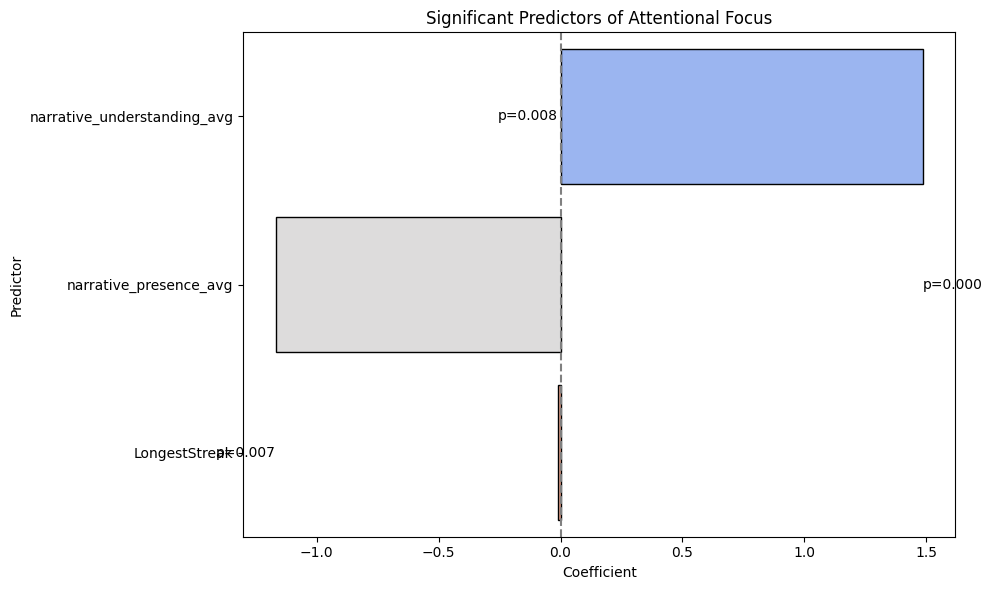

In [21]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.miscmodels.ordinal_model import OrderedModel
import matplotlib.pyplot as plt
import seaborn as sns

# === Load dataset ===


# === Dependent variable ===
target = 'attentional_focus_avg'
df = df.dropna(subset=[target])
df[target] = pd.Categorical(df[target], ordered=True)

# === Numeric predictors only ===
numeric_cols = df.select_dtypes(include='number').columns.tolist()
numeric_cols = [col for col in numeric_cols if col != target]

# === Store significant results ===
significant_predictors = []

# === Loop over numeric predictors ===
for predictor in numeric_cols:
    temp_df = df[[target, predictor]].dropna()

    try:
        # NO constant added here
        model = OrderedModel(temp_df[target], temp_df[[predictor]], distr='logit')
        result = model.fit(method='bfgs', disp=False)

        p_val = result.pvalues[0]
        coef = result.params[0]

        if p_val < 0.05:
            significant_predictors.append({
                'Predictor': predictor,
                'Coefficient': coef,
                'P-Value': p_val
            })

            print(f"✅ {predictor} — Significant")
            print(result.summary())
            print("\n" + "-"*80 + "\n")
        else:
            print(f"⛔ {predictor} — Not significant")

    except Exception as e:
        print(f"⚠️ Skipped {predictor} due to error: {e}")

# === Visualize Significant Predictors ===
sig_df = pd.DataFrame(significant_predictors).sort_values('P-Value')

if not sig_df.empty:
    plt.figure(figsize=(10, 6))
    sns.barplot(data=sig_df, x='Coefficient', y='Predictor', palette='coolwarm', edgecolor='black')
    plt.title("Significant Predictors of Attentional Focus")
    for index, row in sig_df.iterrows():
        plt.text(row['Coefficient'], index, f"p={row['P-Value']:.3f}",
                 va='center', ha='right' if row['Coefficient'] < 0 else 'left')
    plt.axvline(0, color='gray', linestyle='--')
    plt.tight_layout()
    plt.show()
else:
    print("❌ No significant predictors found.")

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Conversation_ID — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Speech_Balance_Ratio — Not significant
⛔ Engagement_Diff — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Talkativeness_Human — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Participant_x — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ PercentLookingAtChris — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ TotalFramesCompared — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ TimeStart — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ TimeEnd — Not significant
⛔ InteractionDurationSeconds — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Total_Turns — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Human_Turns — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ AI_Turns — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Turn_Balance — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Sentiment_Alignment — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Overlap_Ratio From Voice — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Engagement_Score — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Hand DTW_Distance — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Participant — Not significant
⛔ AverageHeadSync — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ NumStreaks — Not significant
⛔ TotalGazeTime — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ AverageGazeDuration — Not significant
⛔ LongestStreak — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ n_hr_samples — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ mean_hr — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ std_hr — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ min_hr — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ max_hr — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ range_hr — Not significant
⛔ hr_diff_mean — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ hr_diff_std — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ hr_max_jump — Not significant
⛔ duration_minutes — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ mean_acc — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ std_acc — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ max_acc — Not significant
⛔ min_acc — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ range_acc — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ n_acc_samples — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ mean_ibi — Not significant


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ std_ibi — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ rmssd — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ n_ibi_samples — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]


⛔ Session Duration (mins) — Not significant


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ age — Not significant
✅ narrative_understanding_avg — Significant
                               OrderedModel Results                               
Dep. Variable:     narrative_presence_avg   Log-Likelihood:                -76.180
Model:                       OrderedModel   AIC:                             176.4
Method:                Maximum Likelihood   BIC:                             195.7
Date:                    Fri, 29 Aug 2025                                         
Time:                            11:43:16                                         
No. Observations:                      37                                         
Df Residuals:                          25                                         
Df Model:                               1                                         
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1198930024.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sig_df, x='Coefficient', y='Predictor', palette='coolwarm', edgecolor='black')


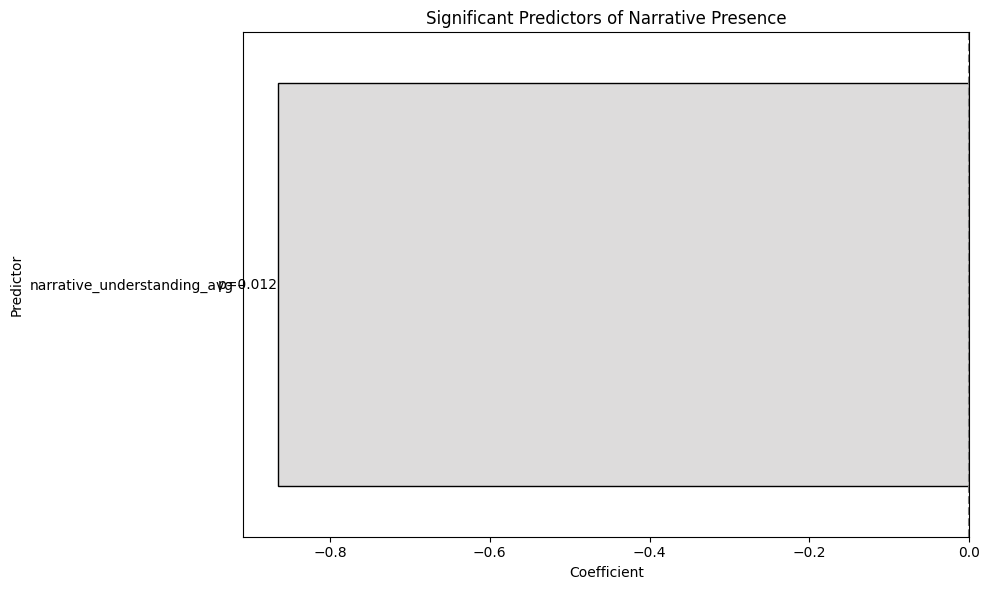

In [23]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.miscmodels.ordinal_model import OrderedModel
import matplotlib.pyplot as plt
import seaborn as sns

# === Load dataset ===


# === Dependent variable ===
target = 'narrative_presence_avg'
df = df.dropna(subset=[target])
df[target] = pd.Categorical(df[target], ordered=True)

# === Numeric predictors only ===
numeric_cols = df.select_dtypes(include='number').columns.tolist()
numeric_cols = [col for col in numeric_cols if col != target]

# === Store significant results ===
significant_predictors = []

# === Loop over numeric predictors ===
for predictor in numeric_cols:
    temp_df = df[[target, predictor]].dropna()

    try:
        # NO constant added here
        model = OrderedModel(temp_df[target], temp_df[[predictor]], distr='logit')
        result = model.fit(method='bfgs', disp=False)

        p_val = result.pvalues[0]
        coef = result.params[0]

        if p_val < 0.05:
            significant_predictors.append({
                'Predictor': predictor,
                'Coefficient': coef,
                'P-Value': p_val
            })

            print(f"✅ {predictor} — Significant")
            print(result.summary())
            print("\n" + "-"*80 + "\n")
        else:
            print(f"⛔ {predictor} — Not significant")

    except Exception as e:
        print(f"⚠️ Skipped {predictor} due to error: {e}")

# === Visualize Significant Predictors ===
sig_df = pd.DataFrame(significant_predictors).sort_values('P-Value')

if not sig_df.empty:
    plt.figure(figsize=(10, 6))
    sns.barplot(data=sig_df, x='Coefficient', y='Predictor', palette='coolwarm', edgecolor='black')
    plt.title("Significant Predictors of Narrative Presence")
    for index, row in sig_df.iterrows():
        plt.text(row['Coefficient'], index, f"p={row['P-Value']:.3f}",
                 va='center', ha='right' if row['Coefficient'] < 0 else 'left')
    plt.axvline(0, color='gray', linestyle='--')
    plt.tight_layout()
    plt.show()
else:
    print("❌ No significant predictors found.")

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\638293267.py:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_value = res.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\638293267.py:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = res.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\638293267.py:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_value = res.pvalues[0]
C:\Users\bmoha\AppData\Loc

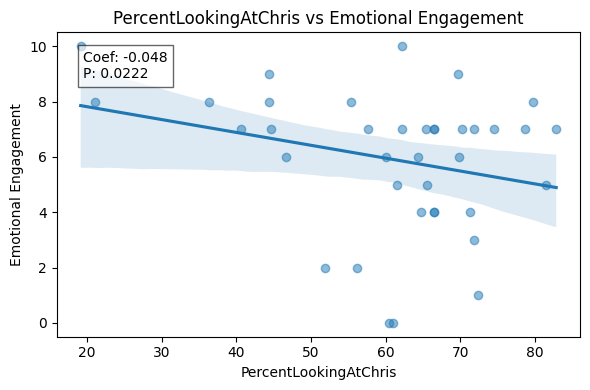

C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\638293267.py:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_value = res.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\638293267.py:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = res.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\638293267.py:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_value = res.pvalues[0]
C:\Users\bmoha\AppData\Loc

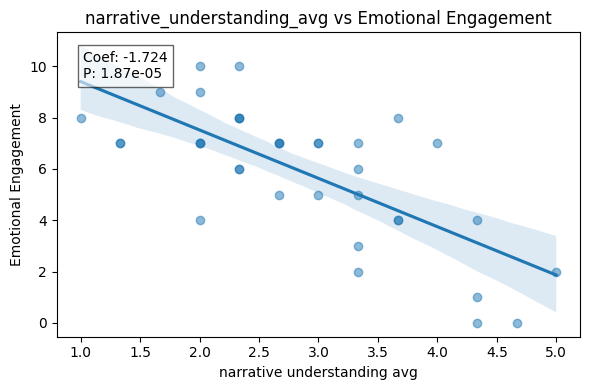


📊 Significant Predictors:
- PercentLookingAtChris: coef=-0.048, p-value=0.0222
- narrative_understanding_avg: coef=-1.724, p-value=0.0000


In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.miscmodels.ordinal_model import OrderedModel
from sklearn.preprocessing import LabelEncoder

# === Load your dataset ===


# === Set target variable ===
target = 'emotional_engagement_avg_y'

# === Drop NA rows ===
df = df.dropna(subset=[target])

# === Encode ordinal target (must be categorical for OrderedModel) ===
le = LabelEncoder()
df['engagement_encoded'] = le.fit_transform(df[target])

# === Select only numeric columns ===
numeric_columns = df.select_dtypes(include='number').columns
numeric_predictors = [col for col in numeric_columns if col not in ['engagement_encoded', target]]

# === Plot setup ===
significant_results = []

for predictor in numeric_predictors:
    try:
        # Drop NA values
        temp_df = df[[predictor, 'engagement_encoded']].dropna()

        # Fit ordinal regression
        model = OrderedModel(temp_df['engagement_encoded'],
                             temp_df[[predictor]],
                             distr='logit')
        res = model.fit(method='bfgs', disp=False)
        p_value = res.pvalues[0]
        coef = res.params[0]

        # Only show if statistically significant
        if p_value < 0.05:
            significant_results.append((predictor, coef, p_value))

            # Plot
            plt.figure(figsize=(6, 4))
            sns.regplot(x=temp_df[predictor], y=temp_df['engagement_encoded'], scatter_kws={'alpha': 0.5})
            plt.title(f"{predictor} vs Emotional Engagement")
            plt.xlabel(predictor.replace("_", " "))
            plt.ylabel("Emotional Engagement")
            plt.annotate(f"Coef: {coef:.3f}\nP: {p_value:.3g}", xy=(0.05, 0.85), xycoords='axes fraction',
                         fontsize=10, bbox=dict(facecolor='white', alpha=0.6))
            plt.tight_layout()
            plt.savefig(f"ordinal_regression_{predictor}.png", dpi=300)
            plt.show()

    except Exception as e:
        print(f"⚠️ Skipped {predictor} due to error: {e}")

# === Summary of significant predictors ===
if significant_results:
    print("\n📊 Significant Predictors:")
    for pred, coef, pval in significant_results:
        print(f"- {pred}: coef={coef:.3f}, p-value={pval:.4f}")
else:
    print("\n❌ No significant predictors found.")


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Conversation_ID — Not significant (p=0.4442)
⛔ Speech_Balance_Ratio — Not significant (p=0.6215)
⛔ Engagement_Diff — Not significant (p=0.8110)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Talkativeness_Human — Not significant (p=0.6063)
⛔ Participant_x — Not significant (p=0.4442)
✅ PercentLookingAtChris — Significant (p=0.0102)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ TotalFramesCompared — Not significant (p=0.4294)
⛔ TimeStart — Not significant (p=0.2724)
⛔ TimeEnd — Not significant (p=0.1073)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ InteractionDurationSeconds — Not significant (p=0.4482)
⛔ Total_Turns — Not significant (p=0.4876)
⛔ Human_Turns — Not significant (p=0.4879)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ AI_Turns — Not significant (p=0.4872)
⛔ Turn_Balance — Not significant (p=0.7525)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Sentiment_Alignment — Not significant (p=0.7067)
⛔ Overlap_Ratio From Voice — Not significant (p=0.4013)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treati

⛔ Engagement_Score — Not significant (p=0.6927)
⛔ Hand DTW_Distance — Not significant (p=0.9981)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ Participant — Not significant (p=0.4442)
⛔ AverageHeadSync — Not significant (p=0.4670)
⛔ NumStreaks — Not significant (p=0.8851)
⛔ TotalGazeTime — Not significant (p=0.3505)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ AverageGazeDuration — Not significant (p=0.1817)
⛔ LongestStreak — Not significant (p=0.9026)
⛔ n_hr_samples — Not significant (p=0.6244)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ mean_hr — Not significant (p=0.7435)
⛔ std_hr — Not significant (p=0.6118)
⛔ min_hr — Not significant (p=0.9087)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ max_hr — Not significant (p=0.6605)
⛔ range_hr — Not significant (p=0.6584)
⛔ hr_diff_mean — Not significant (p=0.1801)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ hr_diff_std — Not significant (p=0.4313)
⛔ hr_max_jump — Not significant (p=0.5703)
⛔ duration_minutes — Not significant (p=nan)
⛔ mean_acc — Not significant (p=0.3741)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ std_acc — Not significant (p=0.3375)
⛔ max_acc — Not significant (p=0.3179)
⛔ min_acc — Not significant (p=0.2720)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ range_acc — Not significant (p=0.3156)
⛔ n_acc_samples — Not significant (p=0.2395)


C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\miniconda3\envs\xr_env\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: M

⛔ mean_ibi — Not significant (p=0.9213)
⛔ std_ibi — Not significant (p=0.5813)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ rmssd — Not significant (p=0.4653)
⛔ n_ibi_samples — Not significant (p=0.9825)
⛔ Session Duration (mins) — Not significant (p=0.1126)


C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = result.params[0]
C:\Users\bmoha\AppData\Local\Temp\ipykernel_30132\1851854759.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_val = result.pvalues[0]
C:\Users\bmoha\App

⛔ age — Not significant (p=0.3151)
✅ narrative_understanding_avg — Significant (p=0.0070)
✅ engagement_encoded — Significant (p=0.0000)


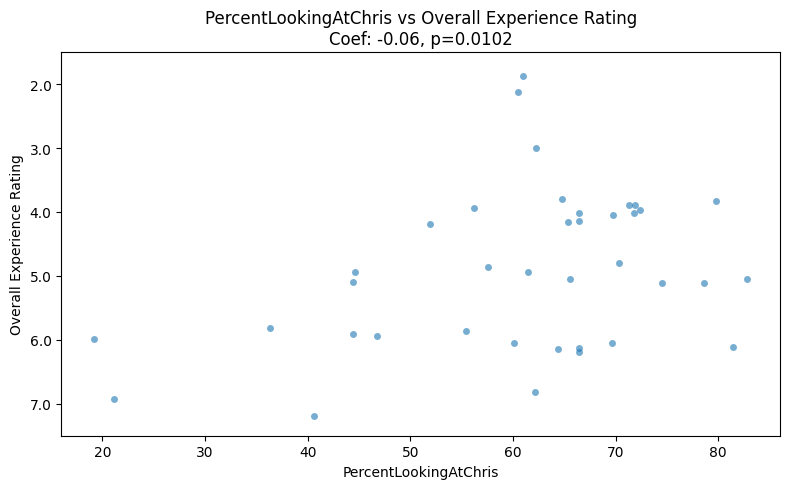

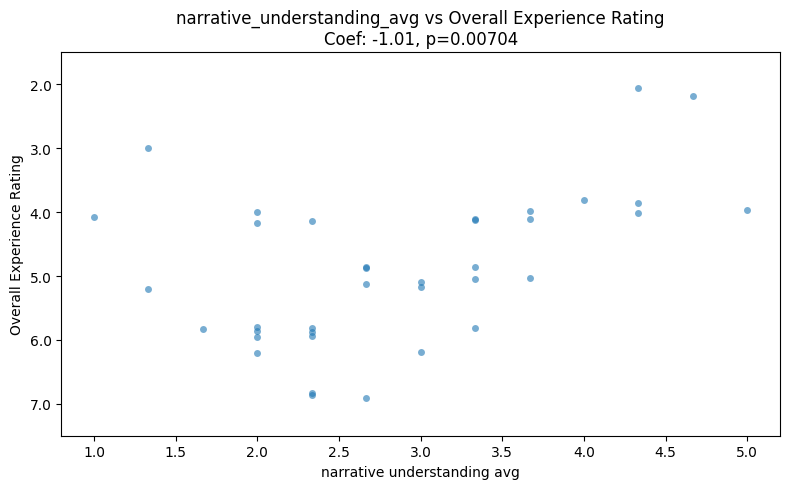

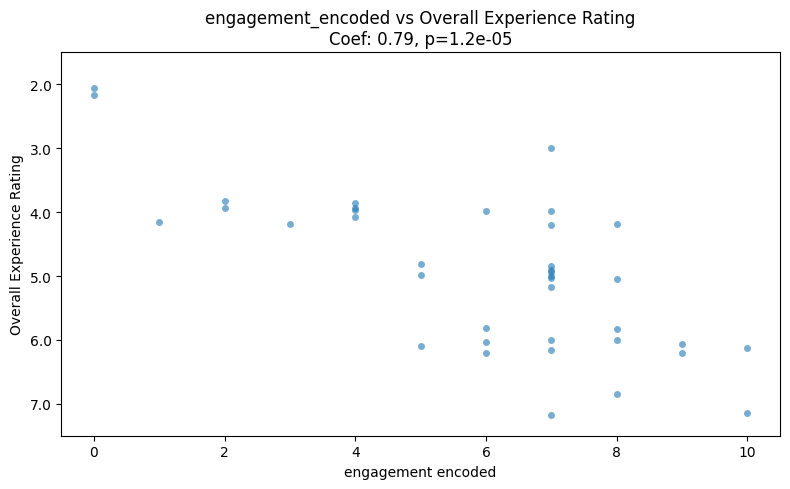

In [26]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.miscmodels.ordinal_model import OrderedModel
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np



# === Dependent variable ===
target = 'Overall Experience Rating'
df = df.dropna(subset=[target])
df[target] = pd.Categorical(df[target], ordered=True)

# === Numeric predictors only ===
numeric_cols = df.select_dtypes(include='number').columns.tolist()
numeric_cols = [col for col in numeric_cols if col != target]

# === Store significant results ===
significant_predictors = []

# === Loop over numeric predictors ===
for predictor in numeric_cols:
    temp_df = df[[target, predictor]].dropna()

    try:
        model = OrderedModel(temp_df[target], temp_df[[predictor]], distr='logit')
        result = model.fit(method='bfgs', disp=False)

        p_val = result.pvalues[0]
        coef = result.params[0]

        if p_val < 0.05:
            significant_predictors.append({
                'Predictor': predictor,
                'Coefficient': coef,
                'P-Value': p_val,
                'model': result,  # Optional, if you want to reuse it
                'data': temp_df
            })

            print(f"✅ {predictor} — Significant (p={p_val:.4f})")

        else:
            print(f"⛔ {predictor} — Not significant (p={p_val:.4f})")

    except Exception as e:
        print(f"⚠️ Skipped {predictor} due to error: {e}")

# === Plot each significant predictor individually ===
if significant_predictors:
    for item in significant_predictors:
        predictor = item['Predictor']
        coef = item['Coefficient']
        p_val = item['P-Value']
        data = item['data']

        plt.figure(figsize=(8, 5))
        sns.stripplot(data=data, x=predictor, y=target, jitter=0.2, alpha=0.6)
        plt.title(f'{predictor} vs {target}\nCoef: {coef:.2f}, p={p_val:.3g}')
        plt.xlabel(predictor.replace("_", " "))
        plt.ylabel(target.replace("_", " "))
        plt.tight_layout()
        plt.savefig(f'ordinal_regression_{predictor}.png', dpi=300)
        plt.show()
else:
    print("❌ No significant predictors found.")
